# Import Dataset

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import sys
!"{sys.executable}" -m pip install kagglehub
import kagglehub
# dataset gambar
puneet6060_intel_image_classification_path = kagglehub.dataset_download('puneet6060/intel-image-classification')
# dataset captioning
adityajn105_flickr8k_path = kagglehub.dataset_download('adityajn105/flickr8k')

print('Data source import complete.')

Using Colab cache for faster access to the 'intel-image-classification' dataset.
Using Colab cache for faster access to the 'flickr8k' dataset.
Data source import complete.


In [ ]:
import os
import sys
import json
import time
import gc
import re
import cv2
import random
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Suppress TensorFlow logging to hide the "Unable to register" warnings
# '3' filters out INFO, WARNING, and ERROR logs at the C++ level
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Set path
sys.path.append(os.path.abspath(".."))

from PIL import Image, ImageOps, ImageEnhance
from sklearn.model_selection import train_test_split
from tqdm import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers as KL
from tensorflow.keras import applications as KA
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, LocallyConnected2D

from sklearn.metrics import confusion_matrix, classification_report, f1_score
from collections import Counter
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score

# Define a random seed for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Optional: Force deterministic behavior on GPU (can slow down training)
# tf.config.experimental.enable_op_determinism()

print("Environment initialized. TensorFlow version:", tf.__version__)

Environment initialized. TensorFlow version: 2.20.0


In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"[MemFix] memory_growth=True pada {len(gpus)} GPU")
    except RuntimeError as e:
        print(f"[MemFix] GPU config error: {e}")
else:
    print("[MemFix] Tidak ada GPU terdeteksi, berjalan di CPU")

try:
    tf.config.set_logical_device_configuration(
        tf.config.list_physical_devices('CPU')[0],
        [tf.config.LogicalDeviceConfiguration(memory_limit=4096)]
    )
    print("CPU memory limit TF = 4096 MB")
except Exception as e:
    print(f"CPU limit skip: {e}")

print(tf.config.list_physical_devices('GPU'))

[MemFix] memory_growth=True pada 1 GPU
CPU limit skip: Setting memory limit on CPU virtual devices is currently not supported
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
for dirname, _, filenames in os.walk(puneet6060_intel_image_classification_path):
    print(dirname)

    for filename in filenames[:5]:
        print("  ", filename)

    print()

/kaggle/input/intel-image-classification

/kaggle/input/intel-image-classification/seg_train

/kaggle/input/intel-image-classification/seg_train/seg_train

/kaggle/input/intel-image-classification/seg_train/seg_train/mountain
   14986.jpg
   3138.jpg
   1700.jpg
   16257.jpg
   2863.jpg

/kaggle/input/intel-image-classification/seg_train/seg_train/street
   1269.jpg
   6241.jpg
   14143.jpg
   2008.jpg
   10213.jpg

/kaggle/input/intel-image-classification/seg_train/seg_train/buildings
   2193.jpg
   11378.jpg
   10730.jpg
   17338.jpg
   16730.jpg

/kaggle/input/intel-image-classification/seg_train/seg_train/sea
   19812.jpg
   16916.jpg
   10304.jpg
   623.jpg
   6197.jpg

/kaggle/input/intel-image-classification/seg_train/seg_train/forest
   7981.jpg
   3863.jpg
   11925.jpg
   10597.jpg
   19299.jpg

/kaggle/input/intel-image-classification/seg_train/seg_train/glacier
   12666.jpg
   13288.jpg
   3750.jpg
   6588.jpg
   7966.jpg

/kaggle/input/intel-image-classification/seg_pred

/

In [ ]:
for dirname, _, filenames in os.walk(adityajn105_flickr8k_path):
    print(dirname)

    for filename in filenames[:5]:
        print("  ", filename)

    print()

/kaggle/input/flickr8k
   captions.txt

/kaggle/input/flickr8k/Images
   3226254560_2f8ac147ea.jpg
   214543992_ce6c0d9f9b.jpg
   2366643786_9c9a830db8.jpg
   3368819708_0bfa0808f8.jpg
   2190227737_6e0bde2623.jpg



# 1. Exploratory Data Analysis (EDA)

## 1.1 Melihat Isi Dataset

Displaying sample images from different categories:

Showing examples for category: 'forest'


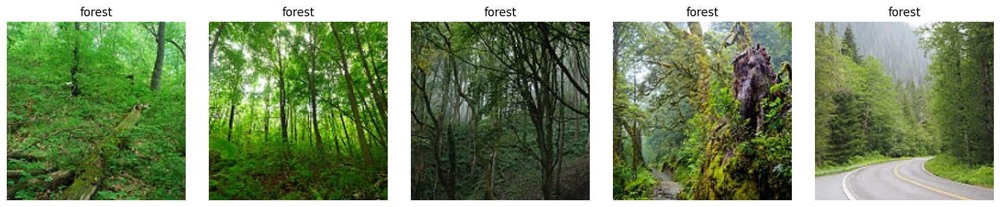

Showing examples for category: 'glacier'


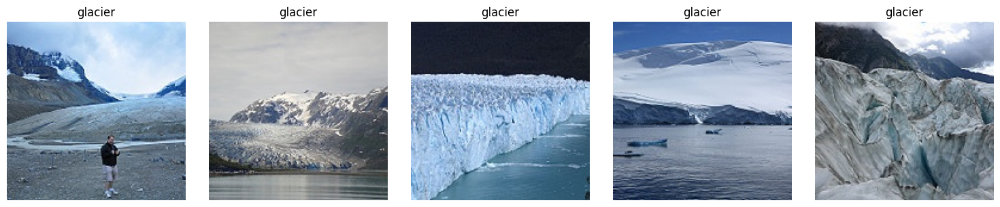

Showing examples for category: 'mountain'


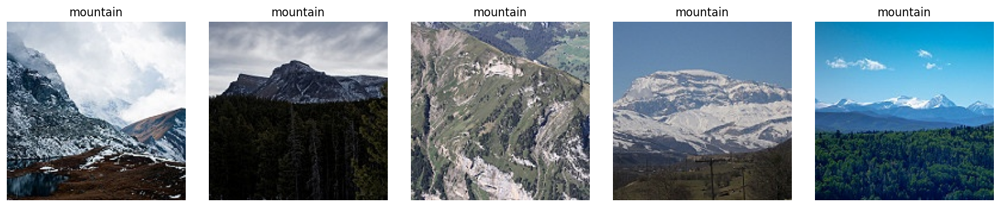

Showing examples for category: 'buildings'


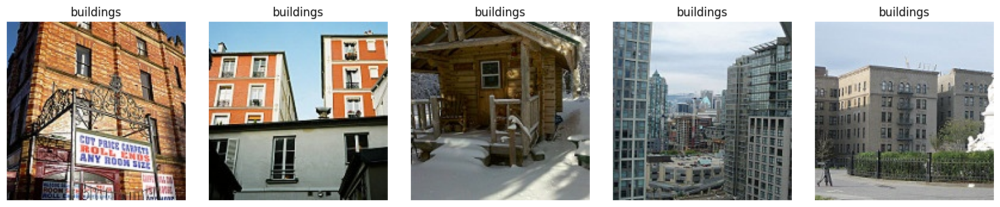

In [ ]:
# Define the base path to the dataset (already defined from cell TN1THskPAqn8)
dataset_path = puneet6060_intel_image_classification_path

# Define the base path for the training images
train_base_path = os.path.join(dataset_path, 'seg_train', 'seg_train')

# Function to display examples from a specific category
def show_category_examples(base_path, category_name, n=5):
    category_dir = os.path.join(base_path, category_name)
    if not os.path.exists(category_dir):
        print(f"Directory for category '{category_name}' not found: {category_dir}")
        return

    # Get a list of image files in the category directory
    image_files = [f for f in os.listdir(category_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not image_files:
        print(f"No image files found in category '{category_name}': {category_dir}")
        return

    # Select 'n' random images if there are more than 'n' available, otherwise take all
    selected_files = random.sample(image_files, min(n, len(image_files)))

    plt.figure(figsize=(15, 3))
    for i, filename in enumerate(selected_files):
        img_path = os.path.join(category_dir, filename)
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert BGR to RGB for matplotlib

            plt.subplot(1, len(selected_files), i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f'{category_name}')
        else:
            print(f"Could not load image: {img_path}")
    plt.tight_layout()
    plt.show()

# Get a list of all categories (subdirectories) in the training set
categories = [d for d in os.listdir(train_base_path) if os.path.isdir(os.path.join(train_base_path, d))]

print("Displaying sample images from different categories:\n")

# Display examples from a few selected categories
# You can change these categories or add more if desired
sample_categories = ['forest', 'glacier', 'mountain', 'buildings']

for category in sample_categories:
    if category in categories:
        print(f"Showing examples for category: '{category}'")
        show_category_examples(train_base_path, category, n=5)
    else:
        print(f"Category '{category}' not found in training set.")


## 1.2 Distribusi Sample per Kelas

Plotting sample distribution per class...


/tmp/ipykernel_484/1296941178.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=category_df, x='Category', palette='viridis')


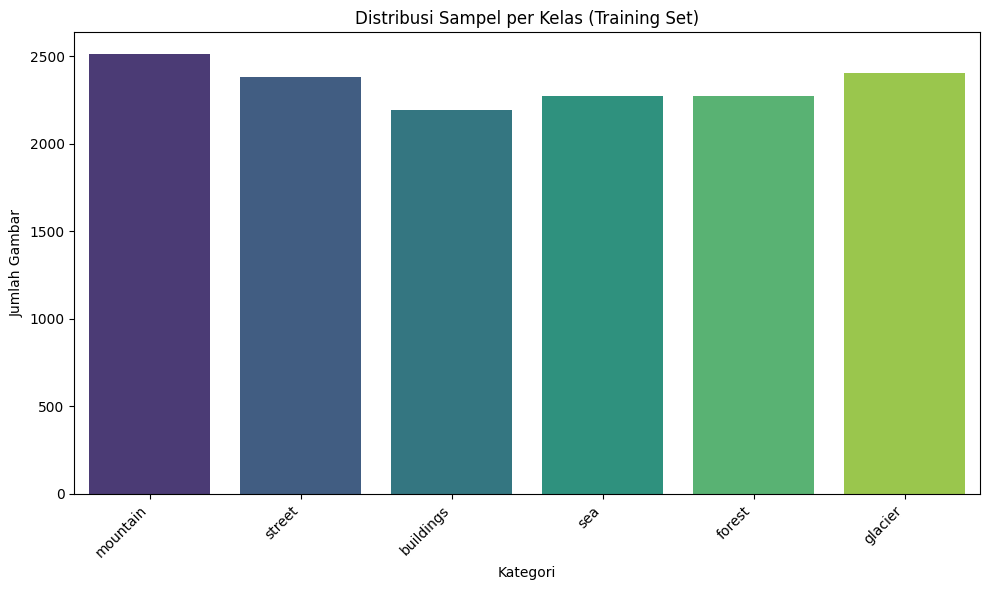


Summary of image counts per category:
- mountain: 2512 images
- street: 2382 images
- buildings: 2191 images
- sea: 2274 images
- forest: 2271 images
- glacier: 2404 images


In [ ]:
train_base_path = os.path.join(dataset_path, 'seg_train', 'seg_train')

# Get a list of all categories (subdirectories) in the training set
categories = [d for d in os.listdir(train_base_path) if os.path.isdir(os.path.join(train_base_path, d))]

# Collect category labels for all images to create a distribution plot
all_image_categories = []
category_counts = {}

print("Collecting image counts per category...")
for category_name in categories:
    category_dir = os.path.join(train_base_path, category_name)
    image_files = [f for f in os.listdir(category_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    count = len(image_files)
    category_counts[category_name] = count
    all_image_categories.extend([category_name] * count)

# Create a DataFrame for the countplot
category_df = pd.DataFrame({
    'Category': all_image_categories
})

print("Plotting sample distribution per class...")
plt.figure(figsize=(10, 6))
sns.countplot(data=category_df, x='Category', palette='viridis')
plt.title('Distribusi Sampel per Kelas (Training Set)')
plt.xlabel('Kategori')
plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.tight_layout()
plt.show()

print("\nSummary of image counts per category:")
for category, count in category_counts.items():
    print(f"- {category}: {count} images")

## 1.3 Variasi Dimensi Gambar dan Aspect Ratio

Processing training images: 100%|██████████| 14034/14034 [01:19<00:00, 176.72it/s]



Plotting distributions...


<Figure size 800x700 with 0 Axes>

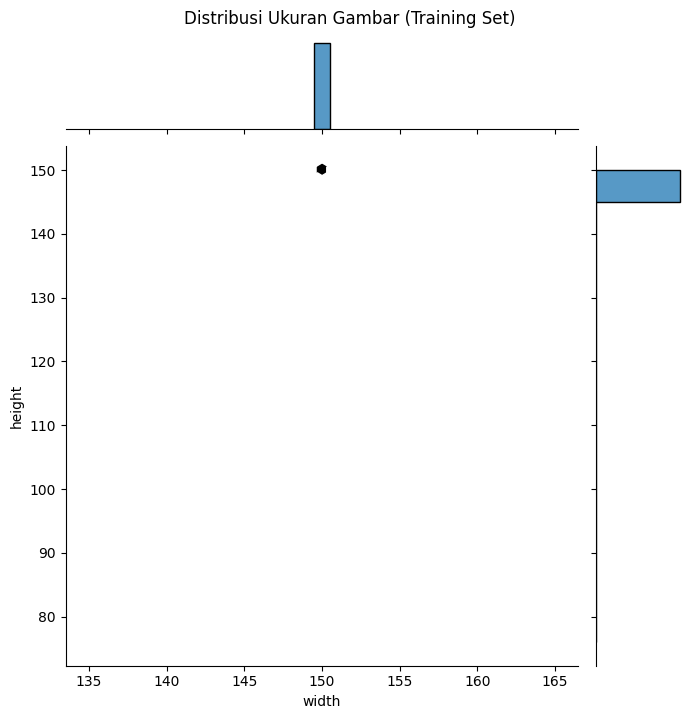

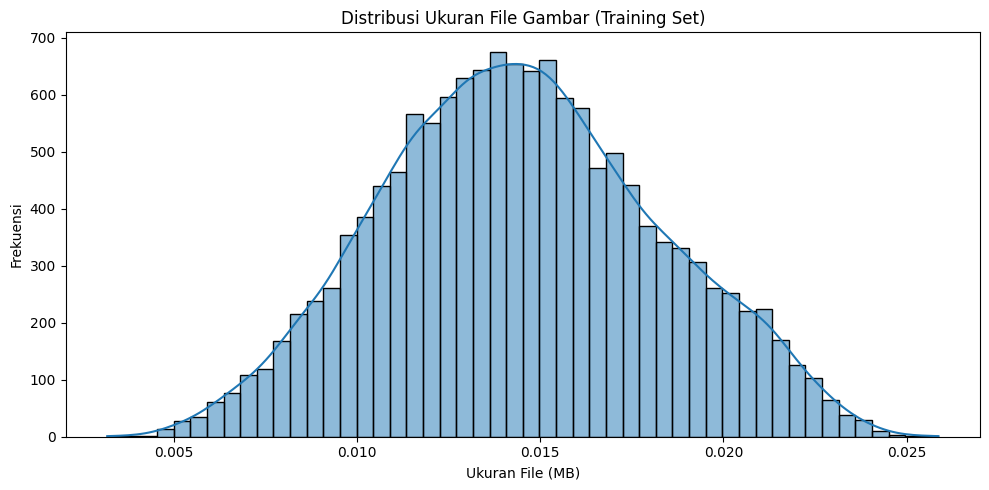

DPI values are largely uniform or not present in image metadata. Unique DPIs: [72.]

--- Summary Statistics (Training Set) ---
Total images processed: 14034
Min Width: 150
Max Width: 150
Average Width: 150.00
Min Height: 76
Max Height: 150
Average Height: 149.91
Min File Size (MB): 0.00
Max File Size (MB): 0.03
Average File Size (MB): 0.01
Min DPI: 72.00
Max DPI: 72.00
Average DPI: 72.00


In [ ]:
dataset_path = puneet6060_intel_image_classification_path
seg_train_path = os.path.join(dataset_path, 'seg_train', 'seg_train')

def get_image_paths(base_dir):
    for root, _, files in os.walk(base_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                yield os.path.join(root, file)

print("Collecting image metadata from the training set...")
dims = []
file_sizes = []
dpi_values = []

# Get all image paths from the training directory
image_paths = list(get_image_paths(seg_train_path))

for img_path in tqdm(image_paths, desc="Processing training images"):
    try:
        with Image.open(img_path) as img:
            dims.append(img.size)
            file_sizes.append(os.path.getsize(img_path))
            # Get DPI, default to (72, 72) if not found
            dpi_values.append(img.info.get('dpi', (72, 72)))
    except Exception as e:
        print(f"Could not process image {img_path}: {e}")

dims_df = pd.DataFrame(dims, columns=['width', 'height'])
dims_df['file_size'] = file_sizes

processed_dpi_list = []
for dpi_entry in dpi_values:
    try:
        # DPI can be a tuple (x, y) or a single value. Take the first element if it's a tuple.
        if isinstance(dpi_entry, tuple):
            processed_dpi_list.append(float(dpi_entry[0]))
        else:
            processed_dpi_list.append(float(dpi_entry))
    except (ValueError, TypeError):
        processed_dpi_list.append(72.0) # Default DPI if extraction fails

dims_df['dpi'] = processed_dpi_list

# Plotting distributions
print("\nPlotting distributions...")

# Distribution of Image Dimensions (Width vs Height)
plt.figure(figsize=(8, 7))
sns.jointplot(data=dims_df, x='width', y='height', kind='hex', height=7)
plt.suptitle("Distribusi Ukuran Gambar (Training Set)", y=1.02)
plt.show()

# Distribution of File Sizes
plt.figure(figsize=(10, 5))
# Convert bytes to MB for better readability
sns.histplot(dims_df['file_size'] / (1024 * 1024), kde=True, bins=50)
plt.title("Distribusi Ukuran File Gambar (Training Set)")
plt.xlabel("Ukuran File (MB)")
plt.ylabel("Frekuensi")
plt.tight_layout()
plt.show()

# Distribution of Image Resolution (DPI)
# Only plot if there's meaningful variation in DPI values
if dims_df['dpi'].nunique() > 1:
    plt.figure(figsize=(10, 5))
    sns.histplot(dims_df['dpi'], kde=True, bins=50)
    plt.title("Distribusi Resolusi Gambar (DPI) (Training Set)")
    plt.xlabel("DPI")
    plt.ylabel("Frekuensi")
    plt.tight_layout()
    plt.show()
else:
    print(f"DPI values are largely uniform or not present in image metadata. Unique DPIs: {dims_df['dpi'].unique()}")

print("\n--- Summary Statistics (Training Set) ---")
print(f"Total images processed: {len(dims_df)}")
print(f"Min Width: {dims_df['width'].min()}")
print(f"Max Width: {dims_df['width'].max()}")
print(f"Average Width: {dims_df['width'].mean():.2f}")
print(f"Min Height: {dims_df['height'].min()}")
print(f"Max Height: {dims_df['height'].max()}")
print(f"Average Height: {dims_df['height'].mean():.2f}")
print(f"Min File Size (MB): {(dims_df['file_size'].min() / (1024 * 1024)):.2f}")
print(f"Max File Size (MB): {(dims_df['file_size'].max() / (1024 * 1024)):.2f}")
print(f"Average File Size (MB): {(dims_df['file_size'].mean() / (1024 * 1024)):.2f}")
print(f"Min DPI: {dims_df['dpi'].min():.2f}")
print(f"Max DPI: {dims_df['dpi'].max():.2f}")
print(f"Average DPI: {dims_df['dpi'].mean():.2f}")

## 1.4 Distribusi Intensitas Nilai Piksel per Kelas


Plotting average pixel intensity distributions...


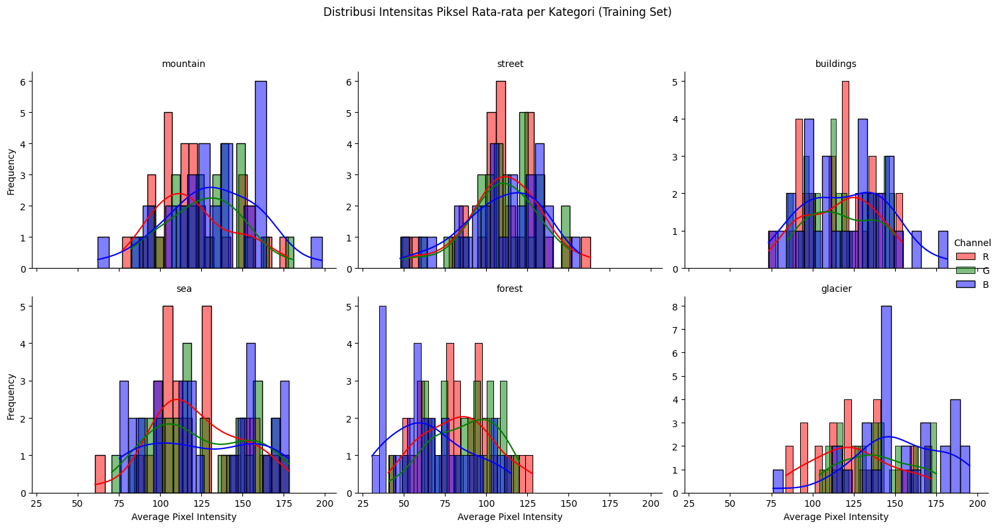

In [ ]:
train_base_path = os.path.join(dataset_path, 'seg_train', 'seg_train')
categories = [d for d in os.listdir(train_base_path) if os.path.isdir(os.path.join(train_base_path, d))]
sample_size = 30

def get_average_pixel_intensities(image_filenames, image_dir):
    avg_r, avg_g, avg_b = [], [], []
    for img_name in tqdm(image_filenames, desc=f"Processing images in {os.path.basename(image_dir)}", leave=False):
        try:
            img_path = os.path.join(image_dir, img_name)
            with Image.open(img_path).convert('RGB') as img:
                img_array = np.array(img)
                avg_r.append(np.mean(img_array[:,:,0]))
                avg_g.append(np.mean(img_array[:,:,1]))
                avg_b.append(np.mean(img_array[:,:,2]))
        except Exception as e:
            print(f"Error processing image {img_name} in {image_dir}: {e}")
    return avg_r, avg_g, avg_b

print("Collecting average pixel intensities for each category...")

all_avg_intensities = []
all_channels = []
all_categories = []

for category_name in categories:
    category_dir = os.path.join(train_base_path, category_name)

    # Get a list of image files in the category directory
    image_files = [f for f in os.listdir(category_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not image_files:
        print(f"No image files found in category '{category_name}': {category_dir}")
        continue

    sampled_category_files = random.sample(image_files, min(len(image_files), sample_size))
    avg_r, avg_g, avg_b = get_average_pixel_intensities(sampled_category_files, category_dir)

    # Extend the master lists
    all_avg_intensities.extend(avg_r + avg_g + avg_b)
    all_channels.extend(['R']*len(avg_r) + ['G']*len(avg_g) + ['B']*len(avg_b))
    all_categories.extend([category_name]*(len(avg_r) + len(avg_g) + len(avg_b)))


pixel_data_avg_df = pd.DataFrame({
    'Average Intensity': all_avg_intensities,
    'Channel': all_channels,
    'Category': all_categories
})
print("\nPlotting average pixel intensity distributions...")

num_categories = len(categories)
col_wrap_val = min(num_categories, 3)

g = sns.FacetGrid(pixel_data_avg_df, col='Category', col_wrap=col_wrap_val, height=4, aspect=1.2,
                  hue='Channel', palette={'R':'red', 'G':'green', 'B':'blue'}, sharex=True, sharey=False)

g.map(sns.histplot, 'Average Intensity', kde=True, bins=20)

g.set_titles("{col_name}")
g.set_axis_labels("Average Pixel Intensity", "Frequency")
g.add_legend(title="Channel")
plt.suptitle("Distribusi Intensitas Piksel Rata-rata per Kategori (Training Set)", y=1.02)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

## 1.5 Deteksi Outlier (Brightness dan Dimensi)

[EDA Outlier] Mengumpulkan statistik gambar (brightness & dimensi)...
Ditemukan 117 outlier dari 14034 gambar (threshold: [32.4, 196.8])


/tmp/ipykernel_484/1027341727.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax3.boxplot(data_per_class, labels=classes_order, patch_artist=True)


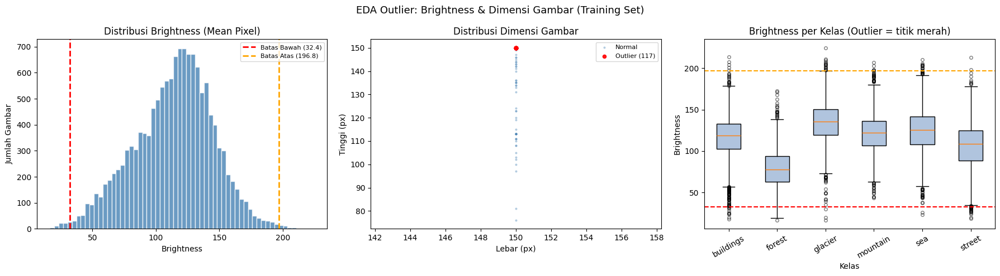

Selesai. 117 path outlier disimpan ke OUTLIER_PATHS_SET.


In [ ]:
print("[EDA Outlier] Mengumpulkan statistik gambar (brightness & dimensi)...")

train_base_path = os.path.join(puneet6060_intel_image_classification_path,
                               'seg_train', 'seg_train')

eda_paths, eda_labels_str, eda_brightness, eda_widths, eda_heights = [], [], [], [], []

for cls in sorted(os.listdir(train_base_path)):
    cls_dir = os.path.join(train_base_path, cls)
    if not os.path.isdir(cls_dir):
        continue
    for fname in os.listdir(cls_dir):
        if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        fp = os.path.join(cls_dir, fname)
        try:
            with Image.open(fp) as img:
                arr = np.array(img.convert('RGB'), dtype=np.float32)
                eda_brightness.append(float(arr.mean()))
                eda_widths.append(img.width)
                eda_heights.append(img.height)
                eda_paths.append(fp)
                eda_labels_str.append(cls)
        except Exception:
            pass

eda_df = pd.DataFrame({
    'path': eda_paths,
    'class': eda_labels_str,
    'brightness': eda_brightness,
    'width': eda_widths,
    'height': eda_heights,
})

# Hitung batas outlier brightness dengan IQR
Q1_b  = eda_df['brightness'].quantile(0.25)
Q3_b  = eda_df['brightness'].quantile(0.75)
IQR_b = Q3_b - Q1_b
LOW_BRIGHT  = Q1_b - 1.5 * IQR_b
HIGH_BRIGHT = Q3_b + 1.5 * IQR_b

# Simpan threshold ke variabel global agar dipakai di sel 2.3
OUTLIER_BRIGHTNESS_LOW  = max(LOW_BRIGHT,  20.0)   # hard-floor 20
OUTLIER_BRIGHTNESS_HIGH = min(HIGH_BRIGHT, 240.0)  # hard-ceil 240

outlier_mask = (
    (eda_df['brightness'] < OUTLIER_BRIGHTNESS_LOW) |
    (eda_df['brightness'] > OUTLIER_BRIGHTNESS_HIGH)
)
n_outliers = outlier_mask.sum()
print(f"Ditemukan {n_outliers} outlier dari {len(eda_df)} gambar "
      f"(threshold: [{OUTLIER_BRIGHTNESS_LOW:.1f}, {OUTLIER_BRIGHTNESS_HIGH:.1f}])")

# Plot 1: Distribusi Brightness + IQR fence
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

ax = axes[0]
ax.hist(eda_df['brightness'], bins=60, color='steelblue', alpha=0.8, edgecolor='white')
ax.axvline(OUTLIER_BRIGHTNESS_LOW,  color='red',    linestyle='--', lw=2,
           label=f'Batas Bawah ({OUTLIER_BRIGHTNESS_LOW:.1f})')
ax.axvline(OUTLIER_BRIGHTNESS_HIGH, color='orange', linestyle='--', lw=2,
           label=f'Batas Atas ({OUTLIER_BRIGHTNESS_HIGH:.1f})')
ax.set_title('Distribusi Brightness (Mean Pixel)')
ax.set_xlabel('Brightness'); ax.set_ylabel('Jumlah Gambar')
ax.legend(fontsize=8)

# Plot 2: Scatter Width vs Height, warna = outlier
ax2 = axes[1]
normal_df  = eda_df[~outlier_mask]
outlier_df = eda_df[outlier_mask]
ax2.scatter(normal_df['width'],  normal_df['height'],
            s=4, alpha=0.3, color='steelblue', label='Normal')
ax2.scatter(outlier_df['width'], outlier_df['height'],
            s=20, alpha=0.9, color='red', label=f'Outlier ({n_outliers})')
ax2.set_title('Distribusi Dimensi Gambar')
ax2.set_xlabel('Lebar (px)'); ax2.set_ylabel('Tinggi (px)')
ax2.legend(fontsize=8)

# Plot 3: Boxplot brightness per kelas
ax3 = axes[2]
classes_order = sorted(eda_df['class'].unique())
data_per_class = [eda_df[eda_df['class'] == c]['brightness'].values for c in classes_order]
bp = ax3.boxplot(data_per_class, labels=classes_order, patch_artist=True)
for patch in bp['boxes']:
    patch.set_facecolor('lightsteelblue')
for flier in bp['fliers']:
    flier.set(marker='o', color='red', markersize=4, alpha=0.5)
ax3.axhline(OUTLIER_BRIGHTNESS_LOW,  color='red',    linestyle='--', lw=1.5)
ax3.axhline(OUTLIER_BRIGHTNESS_HIGH, color='orange', linestyle='--', lw=1.5)
ax3.set_title('Brightness per Kelas (Outlier = titik merah)')
ax3.set_xlabel('Kelas'); ax3.set_ylabel('Brightness')
ax3.tick_params(axis='x', rotation=30)

plt.suptitle('EDA Outlier: Brightness & Dimensi Gambar (Training Set)', fontsize=13)
plt.tight_layout()
plt.show()

OUTLIER_PATHS_SET = set(eda_df[outlier_mask]['path'].tolist())
print(f"Selesai. {len(OUTLIER_PATHS_SET)} path outlier disimpan ke OUTLIER_PATHS_SET.")


# 2. Data Cleaning and Preprocessing

## 2.1 Resizing dan Normalisasi Gambar


--- Preprocessing Gambar ---


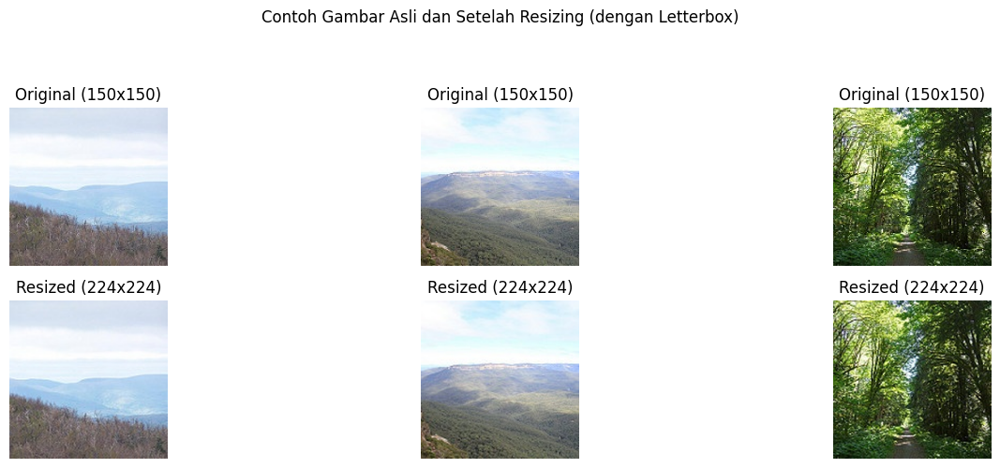


Shape dari gambar yang dinormalisasi: (224, 224, 3)
Min value dari gambar yang dinormalisasi: -2.1179
Max value dari gambar yang dinormalisasi: 2.6400
Mean value dari gambar yang dinormalisasi: -0.6972


In [ ]:
def letterbox_resize(img, target_size=224):
    # Resize gambar dengan padding agar rasio aspek terjaga
    original_width, original_height = img.size
    ratio = min(target_size / original_width, target_size / original_height)
    new_width = int(original_width * ratio)
    new_height = int(original_height * ratio)

    img = img.resize((new_width, new_height), Image.LANCZOS)

    new_img = Image.new("RGB", (target_size, target_size), (0, 0, 0)) # Hitam sebagai padding
    offset = ((target_size - new_width) // 2, (target_size - new_height) // 2)
    new_img.paste(img, offset)
    return new_img

def augment_image(img):
    # Melakukan augmentasi gambar secara acak (flip horizontal, penyesuaian kecerahan)
    if random.random() < 0.5:
        img = ImageOps.mirror(img)  # flip horizontal
    if random.random() < 0.5:
        enhancer = ImageEnhance.Brightness(img)
        img = enhancer.enhance(random.uniform(0.8, 1.2))  # adjust brightness
    return img

def crop_partial(img, portion=0.2):
    # Melakukan crop sebagian gambar secara acak dan mengubah ukurannya kembali
    width, height = img.size
    crop_width = int(width * portion)
    crop_height = int(height * portion)

    left = random.randint(0, width - crop_width)
    top = random.randint(0, height - crop_height)
    right = left + crop_width
    bottom = top + crop_height

    img = img.crop((left, top, right, bottom))
    img = img.resize((224, 224), Image.LANCZOS)
    return img

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD  = np.array([0.229, 0.224, 0.225])

def load_and_preprocess_image(img_path, target_size=224, augment=False, use_partial_crop=False):
    # Memuat, mengubah ukuran, melakukan augmentasi, dan menormalisasi gambar
    try:
        with Image.open(img_path).convert("RGB") as img:
            if augment and use_partial_crop:
                img_processed = crop_partial(img, portion=0.2)
            else:
                img_processed = letterbox_resize(img, target_size=target_size)

            if augment:
                img_processed = augment_image(img_processed)

            img_arr = np.array(img_processed) / 255.0
            img_arr = (img_arr - IMAGENET_MEAN) / IMAGENET_STD

            return img_processed, img_arr
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        return None, None

def get_random_image_paths(base_dir, num_samples=3):
    # Mendapatkan jalur ke beberapa gambar acak dari seluruh kategori
    all_image_paths = []
    for root, _, files in os.walk(base_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                all_image_paths.append(os.path.join(root, file))

    if len(all_image_paths) < num_samples:
        print(f"Warning: Not enough images ({len(all_image_paths)}) to sample {num_samples} from {base_dir}. Sampling all available.")
        return all_image_paths
    return random.sample(all_image_paths, num_samples)


print("\n--- Preprocessing Gambar ---")

train_base_path = os.path.join(dataset_path, 'seg_train', 'seg_train')
sample_image_paths = get_random_image_paths(train_base_path, num_samples=3)

if not sample_image_paths:
    print("Tidak ada gambar sampel yang ditemukan untuk demonstrasi.")
else:
    plt.figure(figsize=(15, 5))
    for i, img_path in enumerate(sample_image_paths):
        original_img = Image.open(img_path).convert("RGB")
        resized_img_pil, normalized_img_arr = load_and_preprocess_image(img_path, target_size=224, augment=False, use_partial_crop=False)

        if original_img and resized_img_pil is not None:
            # Display original image
            plt.subplot(2, len(sample_image_paths), i + 1)
            plt.imshow(original_img)
            plt.title(f"Original ({original_img.size[0]}x{original_img.size[1]})")
            plt.axis('off')

            # Display resized (letterboxed) image
            plt.subplot(2, len(sample_image_paths), i + 1 + len(sample_image_paths))
            plt.imshow(resized_img_pil)
            plt.title(f"Resized (224x224)")
            plt.axis('off')

    plt.suptitle("Contoh Gambar Asli dan Setelah Resizing (dengan Letterbox)", y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    if normalized_img_arr is not None:
        print(f"\nShape dari gambar yang dinormalisasi: {normalized_img_arr.shape}")
        print(f"Min value dari gambar yang dinormalisasi: {normalized_img_arr.min():.4f}")
        print(f"Max value dari gambar yang dinormalisasi: {normalized_img_arr.max():.4f}")
        print(f"Mean value dari gambar yang dinormalisasi: {normalized_img_arr.mean():.4f}")

## 2.2 Pembagian Dataset

In [ ]:
dataset_path    = puneet6060_intel_image_classification_path
train_base_path = os.path.join(dataset_path, 'seg_train', 'seg_train')
test_base_path  = os.path.join(dataset_path, 'seg_test',  'seg_test')

IMG_SIZE   = 150
BATCH_SIZE = 32
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

# 1. Kumpulkan paths & labels
print("--- Membangun dataset dari direktori ---")

train_meta = build_dataset_from_directory(
    root_dir   = dataset_path,
    target_size = (IMG_SIZE, IMG_SIZE),
    splits      = ('seg_train/seg_train',)
)
test_meta = build_dataset_from_directory(
    root_dir   = dataset_path,
    target_size = (IMG_SIZE, IMG_SIZE),
    splits      = ('seg_test/seg_test',)
)

all_train_paths  = train_meta['seg_train/seg_train']['paths']
all_train_labels = train_meta['seg_train/seg_train']['labels'].tolist()
all_test_paths   = test_meta['seg_test/seg_test']['paths']
all_test_labels  = test_meta['seg_test/seg_test']['labels'].tolist()
class_names      = train_meta['seg_train/seg_train']['class_names']

category_to_label = {c: i for i, c in enumerate(class_names)}
label_to_category = {i: c for i, c in enumerate(class_names)}
print(f"Category to Label Mapping: {category_to_label}")

train_df = pd.DataFrame({'Full_File_Path': all_train_paths, 'Label': all_train_labels})
test_df  = pd.DataFrame({'Full_File_Path': all_test_paths,  'Label': all_test_labels})
print(f"Total training images: {len(train_df)}  |  Test images: {len(test_df)}")

train_split_df, val_df = train_test_split(
    train_df, test_size=0.2, random_state=SEED, stratify=train_df['Label']
)
print(f"Train: {len(train_split_df)}  |  Val: {len(val_df)}")


# 2. Preprocessing function
def _py_load(path_bytes: bytes, augment: bool) -> np.ndarray:
    fp  = path_bytes.decode('utf-8')
    img = load_image(fp, target_size=(IMG_SIZE, IMG_SIZE))

    # ImageNet standardisasi
    img = (img - IMAGENET_MEAN) / IMAGENET_STD

    if augment:
        # Flip horizontal acak
        if np.random.rand() < 0.5:
            img = img[:, ::-1, :]
        factor = np.random.uniform(0.8, 1.2)
        img    = np.clip(img * factor, -3.0, 3.0)

    return img.astype(np.float32)


def preprocess_image_tf(path: tf.Tensor, label: tf.Tensor, augment: bool = False):
    image = tf.py_function(
        func = lambda p: _py_load(p.numpy(), augment),
        inp  = [path],
        Tout = tf.float32,
    )
    image.set_shape([IMG_SIZE, IMG_SIZE, 3])
    return image, label


def make_dataset(paths: list, labels: list,
                 augment: bool = False,
                 shuffle: bool = False,
                 exclude_paths: set = None) -> tf.data.Dataset:
    if exclude_paths:
        filtered = [(p, l) for p, l in zip(paths, labels)
                    if p not in exclude_paths]
        paths, labels = (list(x) for x in zip(*filtered)) if filtered else ([], [])

    ds = tf.data.Dataset.from_tensor_slices(
        (tf.constant(paths), tf.constant(labels, dtype=tf.int32))
    )
    if shuffle:
        ds = ds.shuffle(buffer_size=len(paths), seed=SEED, reshuffle_each_iteration=True)

    ds = ds.map(
        lambda p, l: preprocess_image_tf(p, l, augment=augment),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds


print("--- Membuat tf.data Dataset ---")

_outlier_paths = globals().get('OUTLIER_PATHS_SET', set())
print(f"Mengecualikan {len(_outlier_paths)} outlier dari training set.")

train_ds = make_dataset(
    train_split_df['Full_File_Path'].tolist(),
    train_split_df['Label'].tolist(),
    augment=True, shuffle=True, exclude_paths=_outlier_paths
)
val_ds = make_dataset(
    val_df['Full_File_Path'].tolist(),
    val_df['Label'].tolist(),
    augment=False, shuffle=False
)
test_ds = make_dataset(
    test_df['Full_File_Path'].tolist(),
    test_df['Label'].tolist(),
    augment=False, shuffle=False
)

print(f"Train batches : {train_ds.cardinality().numpy() if train_ds.cardinality().numpy() >= 0 else 'unknown'}")
print(f"Val   batches : {val_ds.cardinality().numpy()   if val_ds.cardinality().numpy()   >= 0 else 'unknown'}")
print(f"Test  batches : {test_ds.cardinality().numpy()  if test_ds.cardinality().numpy()  >= 0 else 'unknown'}")
print("\nPipeline tf.data siap. Gambar dimuat per-batch saat training.")

sample_imgs, sample_labels = next(iter(train_ds))
print(f"\nShape 1 batch train : images={sample_imgs.shape}, labels={sample_labels.shape}")
print(f"dtype={sample_imgs.dtype}, min={sample_imgs.numpy().min():.3f}, max={sample_imgs.numpy().max():.3f}")


--- Membangun dataset dari direktori ---
[Dataset] seg_train/seg_train: 14034 images, 6 classes
[Dataset] seg_test/seg_test: 3000 images, 6 classes
Category to Label Mapping: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
Total training images: 14034  |  Test images: 3000
Train: 11227  |  Val: 2807
--- Membuat tf.data Dataset ---
Mengecualikan 117 outlier dari training set.
Train batches : 348
Val   batches : 88
Test  batches : 94

Pipeline tf.data siap. Gambar dimuat per-batch saat training.

Shape 1 batch train : images=(32, 150, 150, 3), labels=(32,)
dtype=<dtype: 'float32'>, min=-2.516, max=3.000


## 2.3 Penanganan Outlier

Sebelum filter outlier : 11227 gambar
Outlier dihapus        : 96 gambar
Setelah filter outlier : 11131 gambar
Threshold brightness   : [32.4, 196.8]


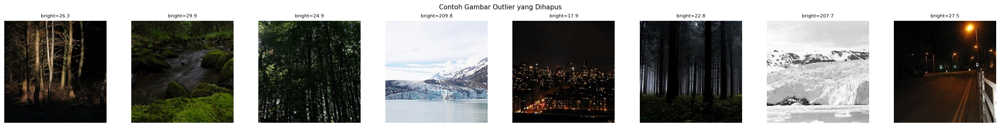

In [ ]:
if 'OUTLIER_PATHS_SET' not in globals():
    print("[Warning] OUTLIER_PATHS_SET belum ada. Jalankan sel EDA 1.5 terlebih dahulu.")
    OUTLIER_PATHS_SET = set()

train_paths_all = train_split_df['Full_File_Path'].tolist()
n_before = len(train_paths_all)
n_outlier = sum(1 for p in train_paths_all if p in OUTLIER_PATHS_SET)
n_after   = n_before - n_outlier

print(f"Sebelum filter outlier : {n_before} gambar")
print(f"Outlier dihapus        : {n_outlier} gambar")
print(f"Setelah filter outlier : {n_after} gambar")
print(f"Threshold brightness   : [{OUTLIER_BRIGHTNESS_LOW:.1f}, {OUTLIER_BRIGHTNESS_HIGH:.1f}]")

# Tampilkan contoh gambar outlier
outlier_sample = list(OUTLIER_PATHS_SET)[:8]
if outlier_sample:
    n_show = len(outlier_sample)
    fig, axes = plt.subplots(1, n_show, figsize=(3 * n_show, 3))
    if n_show == 1:
        axes = [axes]
    for ax, fp in zip(axes, outlier_sample):
        with Image.open(fp) as img:
            arr = np.array(img.convert('RGB'))
            brightness = arr.mean()
        ax.imshow(arr)
        ax.set_title(f'bright={brightness:.1f}', fontsize=8)
        ax.axis('off')
    plt.suptitle('Contoh Gambar Outlier yang Dihapus', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("Tidak ada outlier ditemukan.")

## 2.4 Data Augmentation

Fungsi augmentasi PIL & layer augmentasi Keras berhasil didefinisikan.
Layer augmentasi: ['random_flip', 'random_rotation', 'random_brightness', 'random_contrast', 'random_zoom', 'random_translation']

Gambar sampel: 14986.jpg


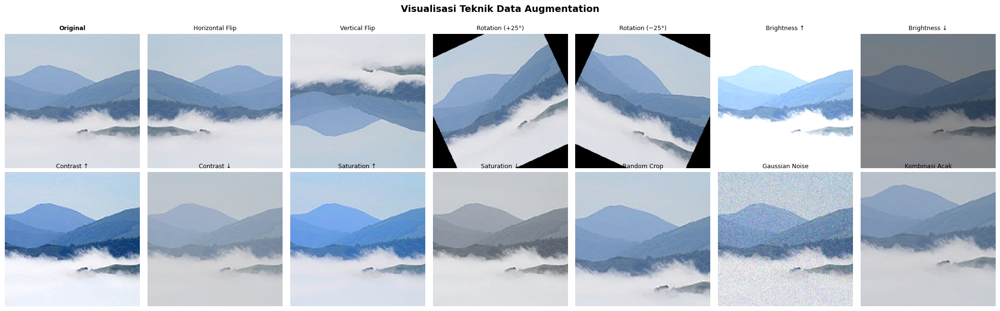


--- Demonstrasi Variasi Augmentasi Acak (1 Gambar → 8 Versi) ---


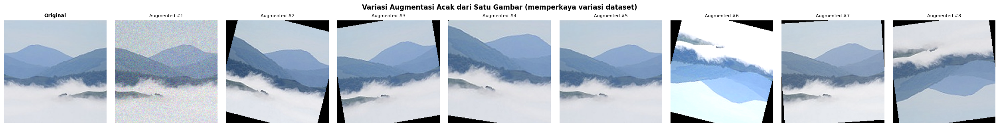


Layer augmentasi Keras siap digunakan dalam model (augmentation_layer).
Gunakan apply_random_augmentation() untuk augmentasi pipeline berbasis PIL.


In [ ]:
import tensorflow as tf
from PIL import Image, ImageOps, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import random

# Konfigurasi
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# 1. Definisi fungsi augmentasi (PIL-based, untuk eksplorasi visual)

def aug_horizontal_flip(img):
    """Flip horizontal: membalik gambar secara horizontal."""
    return ImageOps.mirror(img)

def aug_vertical_flip(img):
    """Flip vertikal: membalik gambar secara vertikal."""
    return ImageOps.flip(img)

def aug_rotation(img, angle=None):
    """Rotasi acak dalam rentang [-30°, +30°]."""
    if angle is None:
        angle = random.uniform(-30, 30)
    return img.rotate(angle, resample=Image.BICUBIC, expand=False)

def aug_brightness(img, factor=None):
    """Penyesuaian brightness: faktor 0.7–1.3."""
    if factor is None:
        factor = random.uniform(0.7, 1.3)
    return ImageEnhance.Brightness(img).enhance(factor)

def aug_contrast(img, factor=None):
    """Penyesuaian kontras: faktor 0.7–1.3."""
    if factor is None:
        factor = random.uniform(0.7, 1.3)
    return ImageEnhance.Contrast(img).enhance(factor)

def aug_saturation(img, factor=None):
    """Penyesuaian saturasi warna: faktor 0.5–1.5."""
    if factor is None:
        factor = random.uniform(0.5, 1.5)
    return ImageEnhance.Color(img).enhance(factor)

def aug_random_crop(img, crop_ratio=0.85):
    """Random crop: potong sebagian gambar lalu resize ke ukuran semula."""
    w, h = img.size
    cw, ch = int(w * crop_ratio), int(h * crop_ratio)
    left  = random.randint(0, w - cw)
    top   = random.randint(0, h - ch)
    img   = img.crop((left, top, left + cw, top + ch))
    return img.resize((w, h), Image.LANCZOS)

def aug_gaussian_noise(img, std=15):
    """Tambahkan Gaussian noise ke gambar."""
    arr  = np.array(img, dtype=np.float32)
    noise = np.random.normal(0, std, arr.shape)
    arr  = np.clip(arr + noise, 0, 255).astype(np.uint8)
    return Image.fromarray(arr)

# 2. Augmentasi kombinasi acak (dipakai saat training)

def apply_random_augmentation(img, p_flip_h=0.5, p_flip_v=0.1,
                               p_rotate=0.5, p_brightness=0.5,
                               p_contrast=0.4, p_saturation=0.4,
                               p_crop=0.3, p_noise=0.2):
    """
    Terapkan augmentasi secara acak berdasarkan probabilitas masing-masing.
    Fungsi ini dapat langsung diintegrasikan ke pipeline preprocessing.
    """
    if random.random() < p_flip_h:
        img = aug_horizontal_flip(img)
    if random.random() < p_flip_v:
        img = aug_vertical_flip(img)
    if random.random() < p_rotate:
        img = aug_rotation(img)
    if random.random() < p_brightness:
        img = aug_brightness(img)
    if random.random() < p_contrast:
        img = aug_contrast(img)
    if random.random() < p_saturation:
        img = aug_saturation(img)
    if random.random() < p_crop:
        img = aug_random_crop(img)
    if random.random() < p_noise:
        img = aug_gaussian_noise(img)
    return img

# 3. Augmentasi TensorFlow-native (dipakai di tf.data pipeline)

def tf_augment(image: tf.Tensor) -> tf.Tensor:
    """
    Augmentasi yang kompatibel dengan tf.data pipeline (graph mode).
    Dipanggil di dalam map() saat membangun dataset training.
    """
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.3)
    image = tf.image.random_contrast(image, lower=0.7, upper=1.3)
    image = tf.image.random_saturation(image, lower=0.5, upper=1.5)
    image = tf.image.random_hue(image, max_delta=0.05)

    angle_rad = tf.random.uniform([], -np.pi/6, np.pi/6)
    image = tf.keras.preprocessing.image.apply_affine_transform(
        image.numpy(), theta=float(angle_rad * 180 / np.pi),
        row_axis=0, col_axis=1, channel_axis=2,
        fill_mode='reflect'
    ) if False else image

    image = tf.clip_by_value(image, 0.0, 1.0)
    return image

augmentation_layer = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(factor=0.083),
    tf.keras.layers.RandomBrightness(factor=0.3),
    tf.keras.layers.RandomContrast(factor=0.3),
    tf.keras.layers.RandomZoom(height_factor=(-0.15, 0.15)),
    tf.keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
], name="data_augmentation")

print("Fungsi augmentasi PIL & layer augmentasi Keras berhasil didefinisikan.")
print(f"Layer augmentasi: {[l.name for l in augmentation_layer.layers]}")


# 4. Visualisasi setiap teknik augmentasi
train_base_path_aug = train_base_path
sample_files = []
for root, _, files in os.walk(train_base_path_aug):
    for f in files:
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            sample_files.append(os.path.join(root, f))
    if len(sample_files) >= 1:
        break

if not sample_files:
    raise RuntimeError("Tidak ada gambar ditemukan di train_base_path.")

sample_path = sample_files[0]
original_img = Image.open(sample_path).convert("RGB").resize((224, 224), Image.LANCZOS)
print(f"\nGambar sampel: {os.path.basename(sample_path)}")


augmentations = [
    ("Original",          original_img),
    ("Horizontal Flip",   aug_horizontal_flip(original_img)),
    ("Vertical Flip",     aug_vertical_flip(original_img)),
    ("Rotation (+25°)",   aug_rotation(original_img, angle=25)),
    ("Rotation (−25°)",   aug_rotation(original_img, angle=-25)),
    ("Brightness ↑",      aug_brightness(original_img, factor=1.4)),
    ("Brightness ↓",      aug_brightness(original_img, factor=0.6)),
    ("Contrast ↑",        aug_contrast(original_img, factor=1.5)),
    ("Contrast ↓",        aug_contrast(original_img, factor=0.6)),
    ("Saturation ↑",      aug_saturation(original_img, factor=1.8)),
    ("Saturation ↓",      aug_saturation(original_img, factor=0.3)),
    ("Random Crop",       aug_random_crop(original_img, crop_ratio=0.80)),
    ("Gaussian Noise",    aug_gaussian_noise(original_img, std=20)),
    ("Kombinasi Acak",    apply_random_augmentation(original_img.copy())),
]

n_cols = 7
n_rows = (len(augmentations) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3.2))
axes = axes.flatten()

for i, (title, img) in enumerate(augmentations):
    axes[i].imshow(img)
    axes[i].set_title(title, fontsize=9, fontweight='bold' if title == "Original" else 'normal')
    axes[i].axis('off')
    if title == "Original":
        for spine in axes[i].spines.values():
            spine.set_edgecolor('gold')
            spine.set_linewidth(3)
            spine.set_visible(True)

for j in range(len(augmentations), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Visualisasi Teknik Data Augmentation", fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# 5. Demonstrasi augmentasi acak berulang pada satu gambar

print("\n--- Demonstrasi Variasi Augmentasi Acak (1 Gambar → 8 Versi) ---")

n_variants = 8
fig2, axes2 = plt.subplots(1, n_variants + 1, figsize=((n_variants + 1) * 2.8, 3.2))

axes2[0].imshow(original_img)
axes2[0].set_title("Original", fontsize=9, fontweight='bold')
axes2[0].axis('off')

for k in range(n_variants):
    aug_img = apply_random_augmentation(original_img.copy())
    axes2[k + 1].imshow(aug_img)
    axes2[k + 1].set_title(f"Augmented #{k+1}", fontsize=8)
    axes2[k + 1].axis('off')

plt.suptitle("Variasi Augmentasi Acak dari Satu Gambar (memperkaya variasi dataset)",
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nLayer augmentasi Keras siap digunakan dalam model (augmentation_layer).")
print("Gunakan apply_random_augmentation() untuk augmentasi pipeline berbasis PIL.")

# 3. Modelling and Validation

## Setup: Load CNN Dataset

In [ ]:
INTEL_ROOT = puneet6060_intel_image_classification_path
TRAIN_DIR = os.path.join(INTEL_ROOT, "seg_train", "seg_train")
VAL_DIR   = os.path.join(INTEL_ROOT, "seg_test",  "seg_test")
TEST_DIR  = os.path.join(INTEL_ROOT, "seg_test",  "seg_test")

IMG_SIZE = (150, 150)
BATCH_SIZE_CNN = 32

def load_split(split_dir, target_size=IMG_SIZE):
    CLASS_NAMES = sorted([
        d for d in os.listdir(split_dir)
        if os.path.isdir(os.path.join(split_dir, d))
    ])
    class_to_idx = {c: i for i, c in enumerate(CLASS_NAMES)}
    paths, labels = [], []
    for cls in CLASS_NAMES:
        cls_dir = os.path.join(split_dir, cls)
        if not os.path.isdir(cls_dir):
            continue
        for fname in os.listdir(cls_dir):
            if fname.lower().endswith((".jpg", ".jpeg", ".png")):
                paths.append(os.path.join(cls_dir, fname))
                labels.append(class_to_idx[cls])
    print(f"  {split_dir}: {len(paths)} images, {len(CLASS_NAMES)} classes (paths only)")
    return paths, np.array(labels, dtype=np.int32), CLASS_NAMES

print("[CNN] Collecting train paths...")
train_paths, y_train_all, CLASS_NAMES = load_split(TRAIN_DIR)

print("[CNN] Collecting test paths...")
test_paths, y_test, _ = load_split(TEST_DIR)

train_paths, val_paths, y_train, y_val = train_test_split(
    train_paths, y_train_all, test_size=0.2, random_state=42, stratify=y_train_all
)

print(f"Train paths: {len(train_paths)}, Val paths: {len(val_paths)}, Test paths: {len(test_paths)}")
print(f"Classes: {CLASS_NAMES}")

# Load on-demand dengan chunk kecil
_LOAD_CHUNK = 2000  # max gambar yang dimuat sekaligus ke RAM

def load_split_lazy(paths, labels, max_samples=None):
    if max_samples is not None and len(paths) > max_samples:
        idx = np.random.choice(len(paths), max_samples, replace=False)
        paths  = [paths[i]  for i in idx]
        labels = labels[idx] if hasattr(labels, '__getitem__') else [labels[i] for i in idx]
        print(f"  [lazy load] subsample ke {max_samples} dari {len(paths)} gambar")
    print(f"  [lazy load] memuat {len(paths)} gambar ke RAM...")
    X = load_batch(paths, target_size=IMG_SIZE)
    y = np.array(labels, dtype=np.int32)
    gc.collect()
    print(f"  [lazy load] selesai. Shape={X.shape}, RAM ~{X.nbytes/1e6:.0f} MB")
    return X, y


print("\nMemuat test split ke RAM (dipakai berulang)...")
X_test, y_test = load_split_lazy(test_paths, y_test)
print(f"Test: {X_test.shape}")
print(f"Classes: {CLASS_NAMES}")
print("\nX_train & X_val TIDAK dimuat sekarang — akan dimuat per-eksperimen jika perlu.")
print("Gunakan load_split_lazy(train_paths, y_train) saat butuh numpy array train.")


[CNN] Collecting train paths...
  /kaggle/input/intel-image-classification/seg_train/seg_train: 14034 images, 6 classes (paths only)
[CNN] Collecting test paths...
  /kaggle/input/intel-image-classification/seg_test/seg_test: 3000 images, 6 classes (paths only)
Train paths: 11227, Val paths: 2807, Test paths: 3000
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

Memuat test split ke RAM (dipakai berulang)...
  [lazy load] memuat 3000 gambar ke RAM...
  [lazy load] selesai. Shape=(3000, 150, 150, 3), RAM ~810 MB
Test: (3000, 150, 150, 3)
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

X_train & X_val TIDAK dimuat sekarang — akan dimuat per-eksperimen jika perlu.
Gunakan load_split_lazy(train_paths, y_train) saat butuh numpy array train.


## 3.1 Perbandingan shared vs non-shared parameter (CNN)

In [ ]:
print('Memuat X_train & X_val untuk CNN experiments...')
X_train, y_train = load_split_lazy(train_paths, y_train)
X_val,   y_val   = load_split_lazy(val_paths,   y_val)
print(f'X_train={X_train.shape}, X_val={X_val.shape}')

WEIGHTS_DIR = "weights/cnn"
LOGS_DIR    = "logs/cnn"
PLOTS_DIR   = "plots/cnn"
os.makedirs(WEIGHTS_DIR, exist_ok=True)
os.makedirs(LOGS_DIR,    exist_ok=True)
os.makedirs(PLOTS_DIR,   exist_ok=True)

BEST_NUM_CONV = 4
BEST_FILTERS  = [64, 128]
BEST_KERNEL   = 3
BEST_POOL     = "max"

# Shared (Conv2D)
shared_model = build_cnn_model(
    num_conv_layers=BEST_NUM_CONV,
    filters=BEST_FILTERS,
    kernel_size=BEST_KERNEL,
    pooling_type=BEST_POOL,
    use_locally_connected=False,
)

shared_result = train_one(
    name="shared_best",
    model=shared_model,
    X_train=X_train, y_train=y_train,
    X_val=X_val,     y_val=y_val,
    epochs=10,
    weights_dir=WEIGHTS_DIR,
    logs_dir=LOGS_DIR,
)

# Non-Shared (LocallyConnected2D)
nonshared_model = build_cnn_model(
    num_conv_layers=BEST_NUM_CONV,
    filters=BEST_FILTERS,
    kernel_size=BEST_KERNEL,
    pooling_type=BEST_POOL,
    use_locally_connected=True,
)

nonshared_result = train_one(
    name="nonshared_best",
    model=nonshared_model,
    X_train=X_train, y_train=y_train,
    X_val=X_val,     y_val=y_val,
    epochs=10,
    weights_dir=WEIGHTS_DIR,
    logs_dir=LOGS_DIR,
)
gc.collect()

# From-Scratch forward pass
scratch_shared    = CNNScratch.from_keras(shared_model,    non_shared=False)
scratch_nonshared = CNNScratch.from_keras(nonshared_model, non_shared=True)

# Evaluasi & Visualisasi
shared_nonshared_metrics = compare_shared_vs_nonshared(
    keras_shared_model=shared_model,
    keras_nonshared_model=nonshared_model,
    scratch_shared=scratch_shared,
    scratch_nonshared=scratch_nonshared,
    X_test=X_test, y_test=y_test,
    save_dir=PLOTS_DIR,
)

# Training curves
plot_history(shared_result["history"],    "shared_best",    save_dir=PLOTS_DIR)
plot_history(nonshared_result["history"], "nonshared_best", save_dir=PLOTS_DIR)

comparison_df = pd.DataFrame([
    {
        "Model":            "Shared Conv2D",
        "Macro F1 (Keras)": shared_nonshared_metrics["f1_keras_shared"],
        "Macro F1 (Scratch)": shared_nonshared_metrics["f1_scratch_shared"],
        "#Params":          shared_nonshared_metrics["params_shared"],
    },
    {
        "Model":            "Non-Shared LocallyConnected2D",
        "Macro F1 (Keras)": shared_nonshared_metrics["f1_keras_nonshared"],
        "Macro F1 (Scratch)": shared_nonshared_metrics["f1_scratch_nonshared"],
        "#Params":          shared_nonshared_metrics["params_nonshared"],
    },
])
display(comparison_df)


Memuat X_train & X_val untuk CNN experiments...
  [lazy load] memuat 11227 gambar ke RAM...
  [lazy load] selesai. Shape=(11227, 150, 150, 3), RAM ~3031 MB
  [lazy load] memuat 2807 gambar ke RAM...
  [lazy load] selesai. Shape=(2807, 150, 150, 3), RAM ~758 MB
X_train=(11227, 150, 150, 3), X_val=(2807, 150, 150, 3)
Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.5360 - loss: 1.1724 - val_accuracy: 0.6281 - val_loss: 0.9199
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - accuracy: 0.6508 - loss: 0.8836 - val_accuracy: 0.7228 - val_loss: 0.7356
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - accuracy: 0.7139 - loss: 0.7566 - val_accuracy: 0.7485 - val_loss: 0.6818
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.7769 - loss: 0.5978 - val_accuracy: 0.7663 - val_loss: 0.7289
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - accuracy: 0.8162 - loss: 0.4950 - val_accuracy: 0.7830 - val_loss: 0.6533
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━

AttributeError: module 'keras._tf_keras.keras.layers' has no attribute 'LocallyConnected2D'

## 3.2 Pengaruh jumlah layer konvolusi (CNN)

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 43ms/step - accuracy: 0.5590 - loss: 1.4881 - val_accuracy: 0.6452 - val_loss: 0.8910
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.7274 - loss: 0.7445 - val_accuracy: 0.7036 - val_loss: 0.7930
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.8113 - loss: 0.5270 - val_accuracy: 0.7032 - val_loss: 0.8777
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.8706 - loss: 0.3701 - val_accuracy: 0.7496 - val_loss: 0.8107
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9165 - loss: 0.2487 - val_accuracy: 0.7371 - val_loss: 0.9510
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9389 - loss: 0.1900 - val_accuracy: 0.7346 - val_loss: 0.9620
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.9491 - loss: 0.1566 - val_accuracy: 0.7570 - val_loss: 0.9384
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9673 - loss: 0.1111 - val_

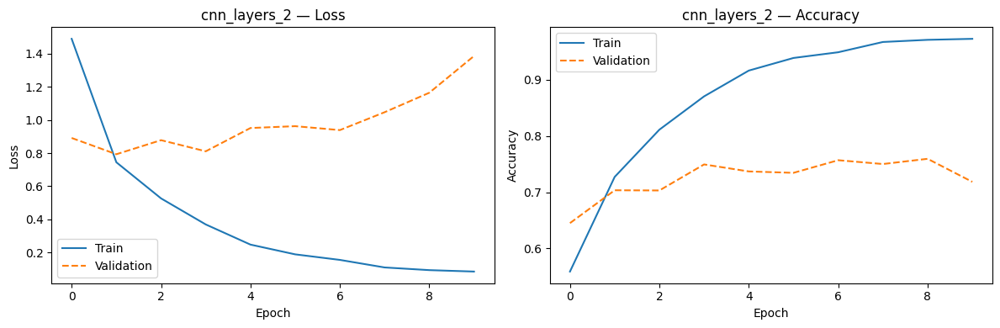

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - accuracy: 0.5385 - loss: 1.1864 - val_accuracy: 0.6566 - val_loss: 0.8435
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.6581 - loss: 0.8704 - val_accuracy: 0.7317 - val_loss: 0.7112
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.7431 - loss: 0.6922 - val_accuracy: 0.7695 - val_loss: 0.6502
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.8081 - loss: 0.5343 - val_accuracy: 0.7528 - val_loss: 0.8010
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.8423 - loss: 0.4371 - val_accuracy: 0.7485 - val_loss: 0.7525
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - accuracy: 0.8796 - loss: 0.3384 - val_accuracy: 0.7773 - val_loss: 0.7327
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - accuracy: 0.9072 - loss: 0.2688 - val_accuracy: 0.8080 - val_loss: 0.6839
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.9140 - loss: 0.2396 - val_acc

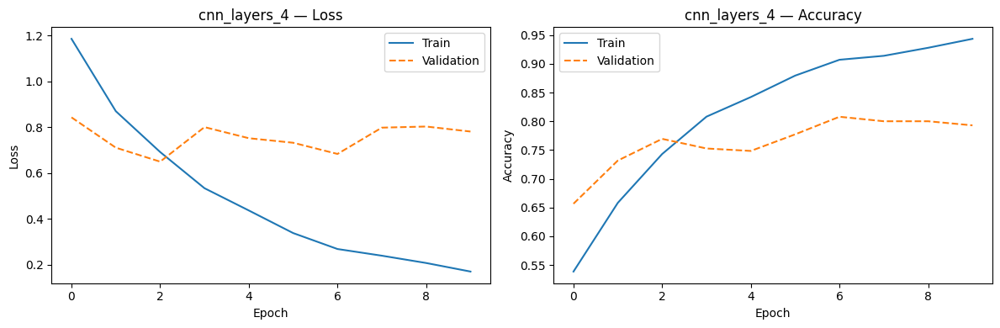

,num_layers,Val F1,Test F1
0,2,0.759250,0.762706
1,4,0.807826,0.805659


In [ ]:
def plot_history(
    history: dict,
    name: str,
    save_dir: str = "plots",
):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    for ax, metric, ylabel in zip(
        axes,
        [('loss', 'val_loss'), ('accuracy', 'val_accuracy')],
        ['Loss', 'Accuracy'],
    ):
        train_key, val_key = metric
        if train_key in history:
            ax.plot(history[train_key],     label='Train')
        if val_key in history:
            ax.plot(history[val_key], "--", label='Validation')
        ax.set_title(f"{name} — {ylabel}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel(ylabel)
        ax.legend()

    plt.tight_layout()

    plt.show()
    plt.close(fig)

layer_results = []

for num_layers in HYPERPARAMETER_GRID["num_conv_layers"]:
    model = build_cnn_model(
        num_conv_layers=num_layers,
        filters=[64, 128, 128, 128],
        kernel_size=3,
        pooling_type="max",
    )
    result = train_one(
        name=f"cnn_layers_{num_layers}",
        model=model,
        X_train=X_train, y_train=y_train,
        X_val=X_val,     y_val=y_val,
        epochs=10,
        weights_dir=WEIGHTS_DIR,
        logs_dir=LOGS_DIR,
    )
    # evaluasi test F1
    y_pred_test = np.argmax(model.predict(X_test, verbose=0), axis=-1)
    test_f1 = macro_f1(y_test, y_pred_test)
    result["test_f1"] = test_f1
    layer_results.append(result)
    # Bersihkan memori setelah tiap iterasi
    keras.backend.clear_session()
    gc.collect()
    plot_history(result["history"], result["name"], save_dir=PLOTS_DIR)

layer_df = pd.DataFrame([
    {"num_layers": int(r["name"].split("_")[-1]),
     "Val F1":  r["best_val_f1"],
     "Test F1": r["test_f1"]}
    for r in layer_results
])
display(layer_df)

## 3.3 Pengaruh banyak filter per layer konvolusi (CNN)

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - accuracy: 0.5792 - loss: 1.3023 - val_accuracy: 0.7228 - val_loss: 0.7569
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7551 - loss: 0.6786 - val_accuracy: 0.7456 - val_loss: 0.6892
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8315 - loss: 0.4705 - val_accuracy: 0.7606 - val_loss: 0.6948
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8828 - loss: 0.3350 - val_accuracy: 0.7702 - val_loss: 0.6871
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9123 - loss: 0.2555 - val_accuracy: 0.7756 - val_loss: 0.8331
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9409 - loss: 0.1725 - val_accuracy: 0.7816 - val_loss: 0.9021
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9544 - loss: 0.1338 - val_accuracy: 0.7898 - val_loss: 0.9109
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9606 - loss: 0.1210 - val_acc

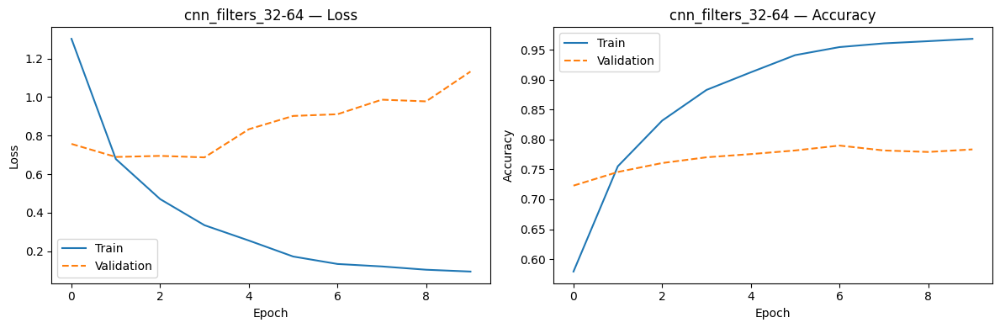

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 43ms/step - accuracy: 0.5595 - loss: 1.2259 - val_accuracy: 0.7082 - val_loss: 0.7882
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.7410 - loss: 0.7171 - val_accuracy: 0.7278 - val_loss: 0.7441
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.8250 - loss: 0.4905 - val_accuracy: 0.7599 - val_loss: 0.6924
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.8834 - loss: 0.3480 - val_accuracy: 0.7634 - val_loss: 0.7645
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.9171 - loss: 0.2424 - val_accuracy: 0.7795 - val_loss: 0.8614
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.9392 - loss: 0.1838 - val_accuracy: 0.7809 - val_loss: 0.8547
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.9569 - loss: 0.1387 - val_accuracy: 0.7841 - val_loss: 0.8889
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.9662 - loss: 0.1036 - v

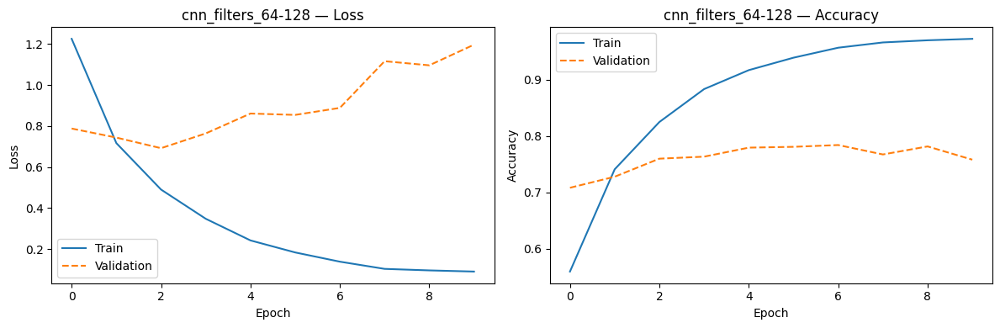

,Filters,Val F1,Test F1
0,"[32, 64]",0.789815,0.785055
1,"[64, 128]",0.782404,0.773043


In [ ]:
def plot_history(
    history: dict,
    name: str,
    save_dir: str = "plots",
):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    for ax, metric, ylabel in zip(
        axes,
        [('loss', 'val_loss'), ('accuracy', 'val_accuracy')],
        ['Loss', 'Accuracy'],
    ):
        train_key, val_key = metric
        if train_key in history:
            ax.plot(history[train_key],     label='Train')
        if val_key in history:
            ax.plot(history[val_key], "--", label='Validation')
        ax.set_title(f"{name} — {ylabel}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel(ylabel)
        ax.legend()

    plt.tight_layout()

    plt.show()
    plt.close(fig)

filter_results = []

for filters in HYPERPARAMETER_GRID["filters"]:
    f_str = "-".join(str(f) for f in filters)
    model = build_cnn_model(
        num_conv_layers=2,
        filters=filters,
        kernel_size=3,
        pooling_type="max",
    )
    result = train_one(
        name=f"cnn_filters_{f_str}",
        model=model,
        X_train=X_train, y_train=y_train,
        X_val=X_val,     y_val=y_val,
        epochs=10,
        weights_dir=WEIGHTS_DIR,
        logs_dir=LOGS_DIR,
    )
    y_pred_test = np.argmax(model.predict(X_test, verbose=0), axis=-1)
    result["test_f1"] = macro_f1(y_test, y_pred_test)
    result["filters"] = str(filters)
    filter_results.append(result)
    # Bersihkan memori setelah tiap iterasi
    keras.backend.clear_session()
    gc.collect()
    plot_history(result["history"], result["name"], save_dir=PLOTS_DIR)

filter_df = pd.DataFrame([
    {"Filters": r["filters"], "Val F1": r["best_val_f1"], "Test F1": r["test_f1"]}
    for r in filter_results
])
display(filter_df)

## 3.4 Pengaruh ukuran filter per layer konvolusi (CNN)

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - accuracy: 0.5559 - loss: 1.3611 - val_accuracy: 0.6797 - val_loss: 0.8314
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7251 - loss: 0.7625 - val_accuracy: 0.7239 - val_loss: 0.7198
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8153 - loss: 0.5214 - val_accuracy: 0.7610 - val_loss: 0.6635
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8821 - loss: 0.3368 - val_accuracy: 0.7478 - val_loss: 0.8510
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9218 - loss: 0.2452 - val_accuracy: 0.7421 - val_loss: 0.8330
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9446 - loss: 0.1735 - val_accuracy: 0.7592 - val_loss: 0.9145
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9572 - loss: 0.1357 - val_accuracy: 0.7770 - val_loss: 0.9219
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9653 - loss: 0.1097 - val_acc

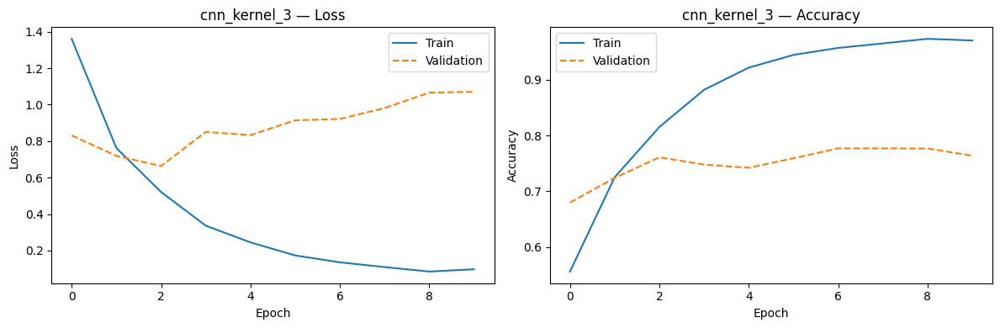

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - accuracy: 0.5245 - loss: 1.3465 - val_accuracy: 0.6694 - val_loss: 0.8462
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6850 - loss: 0.8395 - val_accuracy: 0.7300 - val_loss: 0.7254
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.7722 - loss: 0.6342 - val_accuracy: 0.7360 - val_loss: 0.7893
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.8303 - loss: 0.4749 - val_accuracy: 0.7645 - val_loss: 0.7565
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.8608 - loss: 0.3838 - val_accuracy: 0.7218 - val_loss: 1.0227
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.8984 - loss: 0.2929 - val_accuracy: 0.7492 - val_loss: 0.8961
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9204 - loss: 0.2316 - val_accuracy: 0.7567 - val_loss: 1.0090
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9305 - loss: 0.2047 - val_acc

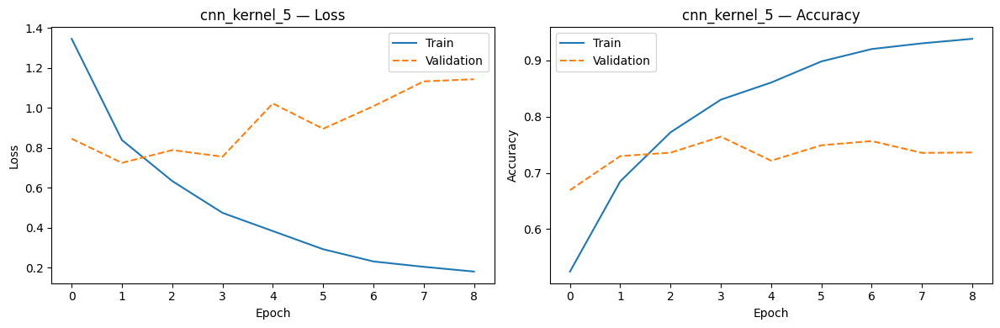

,Kernel Size,Val F1,Test F1
0,3,0.775095,0.758188
1,5,0.765442,0.755248


In [ ]:
def plot_history(
    history: dict,
    name: str,
    save_dir: str = "plots",
):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    for ax, metric, ylabel in zip(
        axes,
        [('loss', 'val_loss'), ('accuracy', 'val_accuracy')],
        ['Loss', 'Accuracy'],
    ):
        train_key, val_key = metric
        if train_key in history:
            ax.plot(history[train_key],     label='Train')
        if val_key in history:
            ax.plot(history[val_key], "--", label='Validation')
        ax.set_title(f"{name} — {ylabel}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel(ylabel)
        ax.legend()

    plt.tight_layout()

    plt.show()
    plt.close(fig)

kernel_results = []

for ksz in HYPERPARAMETER_GRID["kernel_size"]:   # [3, 5]
    model = build_cnn_model(
        num_conv_layers=2,
        filters=[32, 64],
        kernel_size=ksz,
        pooling_type="max",
    )
    result = train_one(
        name=f"cnn_kernel_{ksz}",
        model=model,
        X_train=X_train, y_train=y_train,
        X_val=X_val,     y_val=y_val,
        epochs=10,
        weights_dir=WEIGHTS_DIR,
        logs_dir=LOGS_DIR,
    )
    y_pred_test = np.argmax(model.predict(X_test, verbose=0), axis=-1)
    result["test_f1"] = macro_f1(y_test, y_pred_test)
    result["kernel_size"] = ksz
    kernel_results.append(result)
    # Bersihkan memori setelah tiap iterasi
    keras.backend.clear_session()
    gc.collect()
    plot_history(result["history"], result["name"], save_dir=PLOTS_DIR)

kernel_df = pd.DataFrame([
    {"Kernel Size": r["kernel_size"], "Val F1": r["best_val_f1"], "Test F1": r["test_f1"]}
    for r in kernel_results
])
display(kernel_df)


## 3.5 Pengaruh jenis pooling layer (CNN)

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - accuracy: 0.5582 - loss: 1.2951 - val_accuracy: 0.7007 - val_loss: 0.7855
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7064 - loss: 0.7934 - val_accuracy: 0.7328 - val_loss: 0.6959
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7798 - loss: 0.5967 - val_accuracy: 0.7656 - val_loss: 0.6448
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8382 - loss: 0.4475 - val_accuracy: 0.7602 - val_loss: 0.7596
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8855 - loss: 0.3199 - val_accuracy: 0.7770 - val_loss: 0.7629
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9112 - loss: 0.2554 - val_accuracy: 0.7663 - val_loss: 0.9280
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9338 - loss: 0.1915 - val_accuracy: 0.7798 - val_loss: 0.8841
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9497 - loss: 0.1547 - val_acc

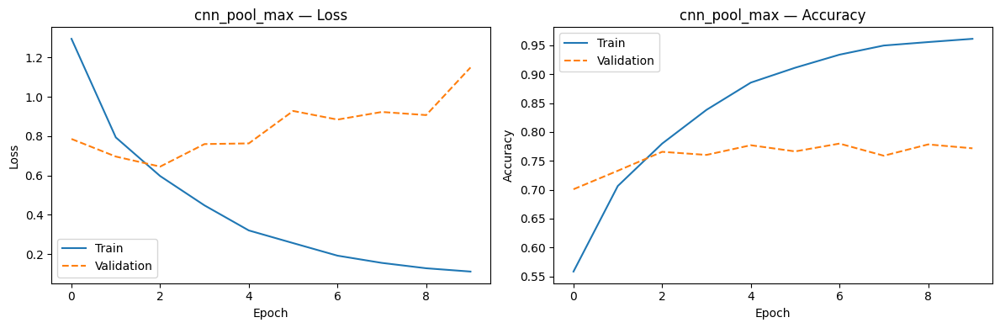

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.5913 - loss: 1.1815 - val_accuracy: 0.7093 - val_loss: 0.7954
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7456 - loss: 0.7090 - val_accuracy: 0.6915 - val_loss: 0.8749
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8336 - loss: 0.4833 - val_accuracy: 0.7357 - val_loss: 0.8361
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8919 - loss: 0.3148 - val_accuracy: 0.7976 - val_loss: 0.6893
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9198 - loss: 0.2366 - val_accuracy: 0.7891 - val_loss: 0.7270
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9447 - loss: 0.1624 - val_accuracy: 0.7545 - val_loss: 0.8306
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9480 - loss: 0.1573 - val_accuracy: 0.7959 - val_loss: 0.9362
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9668 - loss: 0.0996 - val_acc

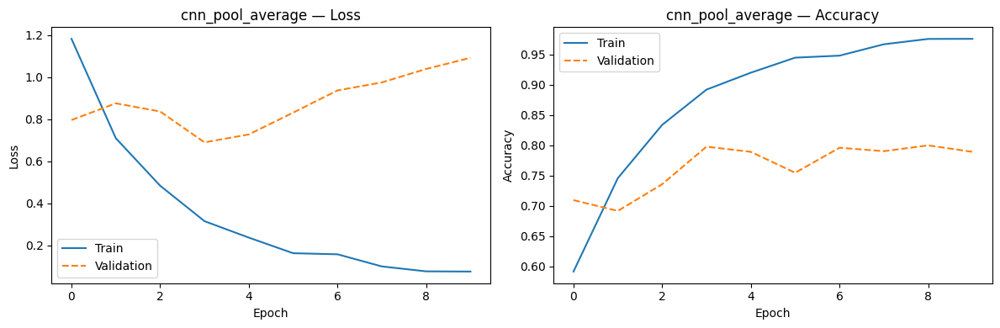

,Pooling Type,Val F1,Test F1
0,max,0.777521,0.769087
1,average,0.800401,0.796757


In [ ]:
def plot_history(
    history: dict,
    name: str,
    save_dir: str = "plots",
):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    for ax, metric, ylabel in zip(
        axes,
        [('loss', 'val_loss'), ('accuracy', 'val_accuracy')],
        ['Loss', 'Accuracy'],
    ):
        train_key, val_key = metric
        if train_key in history:
            ax.plot(history[train_key],     label='Train')
        if val_key in history:
            ax.plot(history[val_key], "--", label='Validation')
        ax.set_title(f"{name} — {ylabel}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel(ylabel)
        ax.legend()

    plt.tight_layout()

    plt.show()
    plt.close(fig)

pool_results = []

for pool_type in HYPERPARAMETER_GRID["pooling_type"]:
    model = build_cnn_model(
        num_conv_layers=2,
        filters=[32, 64],
        kernel_size=3,
        pooling_type=pool_type,
    )
    result = train_one(
        name=f"cnn_pool_{pool_type}",
        model=model,
        X_train=X_train, y_train=y_train,
        X_val=X_val,     y_val=y_val,
        epochs=10,
        weights_dir=WEIGHTS_DIR,
        logs_dir=LOGS_DIR,
    )
    y_pred_test = np.argmax(model.predict(X_test, verbose=0), axis=-1)
    result["test_f1"] = macro_f1(y_test, y_pred_test)
    result["pooling_type"] = pool_type
    pool_results.append(result)
    # Bersihkan memori setelah tiap iterasi
    keras.backend.clear_session()
    gc.collect()
    plot_history(result["history"], result["name"], save_dir=PLOTS_DIR)

pool_df = pd.DataFrame([
    {"Pooling Type": r["pooling_type"], "Val F1": r["best_val_f1"], "Test F1": r["test_f1"]}
    for r in pool_results
])
display(pool_df)


## 3.6 Semua Kombinasi Hyperparameter


[1/16] Experiment: conv2_f32-64_k3_max
  Already trained. Loading from weights/cnn/conv2_f32-64_k3_max.keras

[2/16] Experiment: conv2_f32-64_k3_average
  Already trained. Loading from weights/cnn/conv2_f32-64_k3_average.keras

[3/16] Experiment: conv2_f32-64_k5_max
  Already trained. Loading from weights/cnn/conv2_f32-64_k5_max.keras

[4/16] Experiment: conv2_f32-64_k5_average
  Already trained. Loading from weights/cnn/conv2_f32-64_k5_average.keras

[5/16] Experiment: conv2_f64-128_k3_max
  Already trained. Loading from weights/cnn/conv2_f64-128_k3_max.keras

[6/16] Experiment: conv2_f64-128_k3_average
  Already trained. Loading from weights/cnn/conv2_f64-128_k3_average.keras

[7/16] Experiment: conv2_f64-128_k5_max
Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - accuracy: 0.5249 - loss: 1.4400 - val_accuracy: 0.6441 - val_loss: 0.9163
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - accuracy: 0.6582 - loss: 0.8889 - val_accuracy: 0.6847 - val_loss: 0.8089
Epoch 3/10


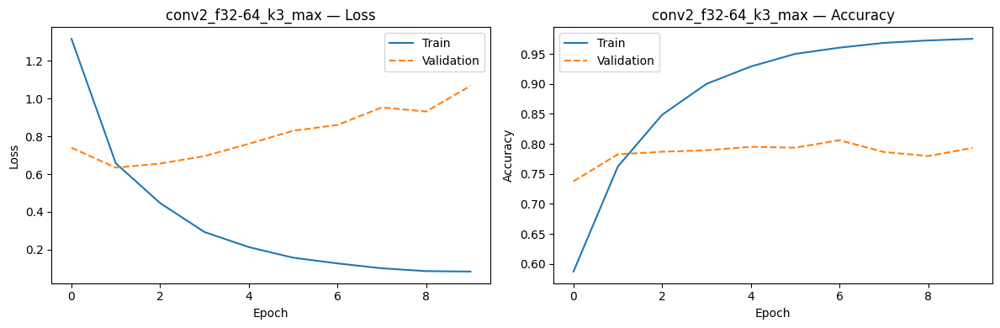

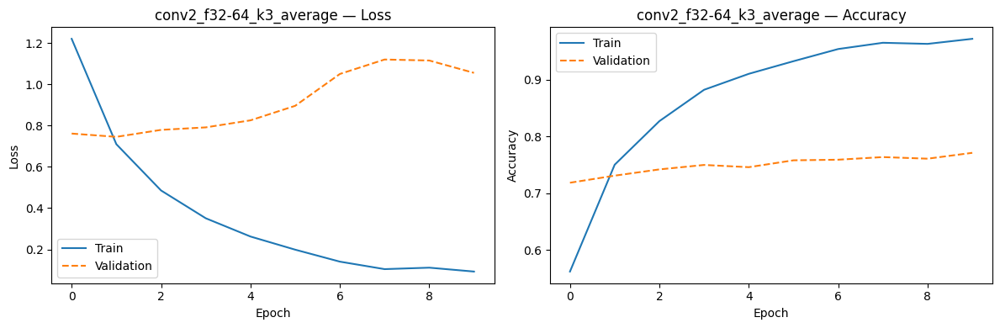

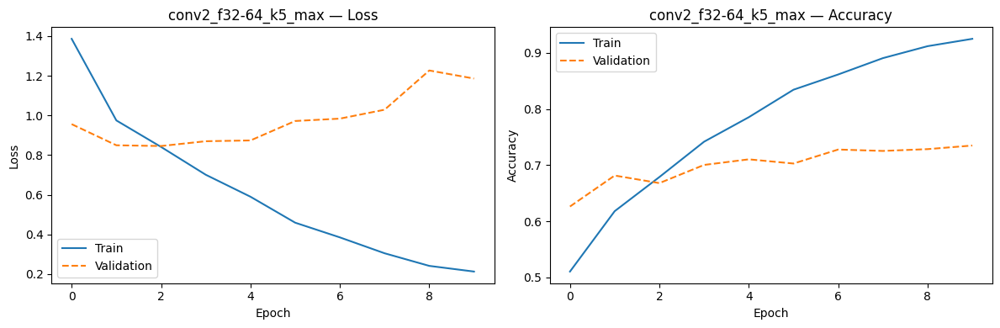

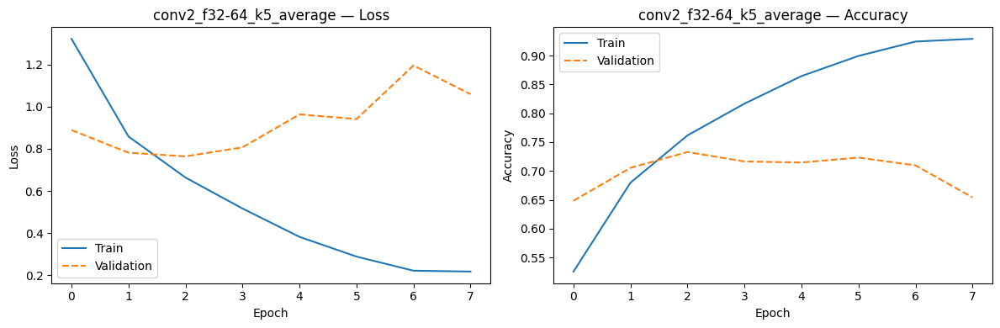

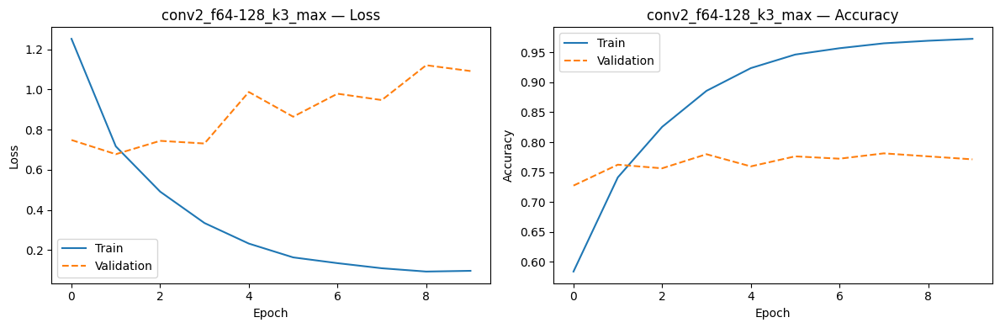

...

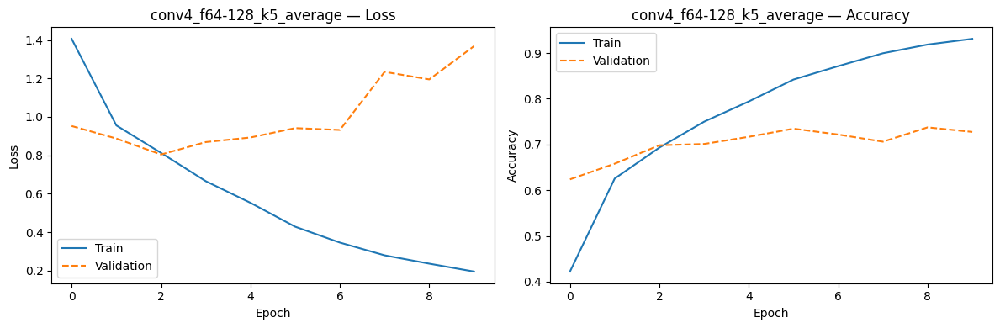

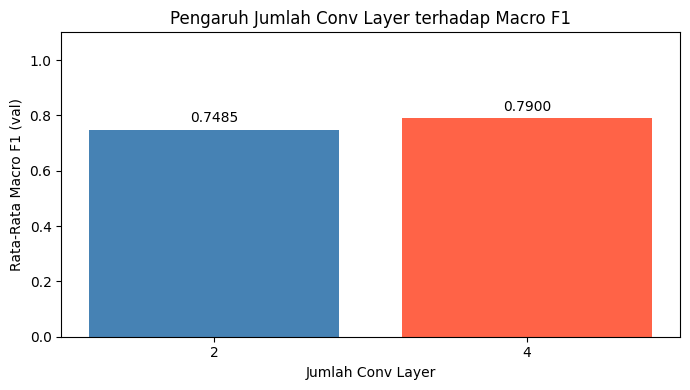

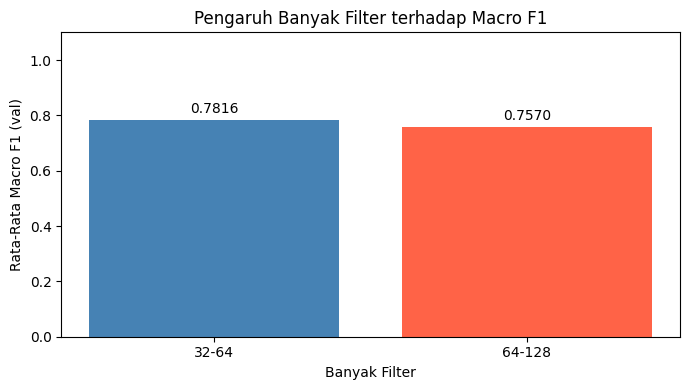

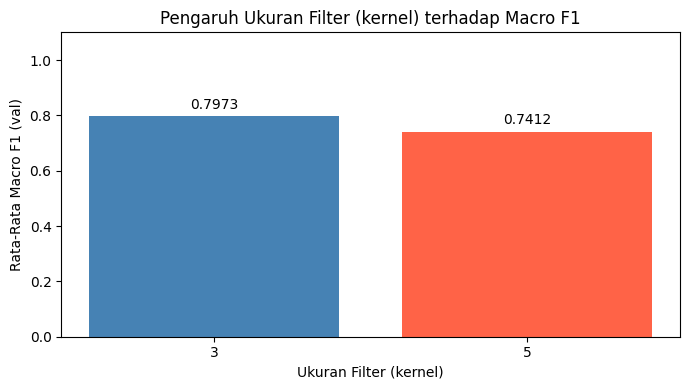

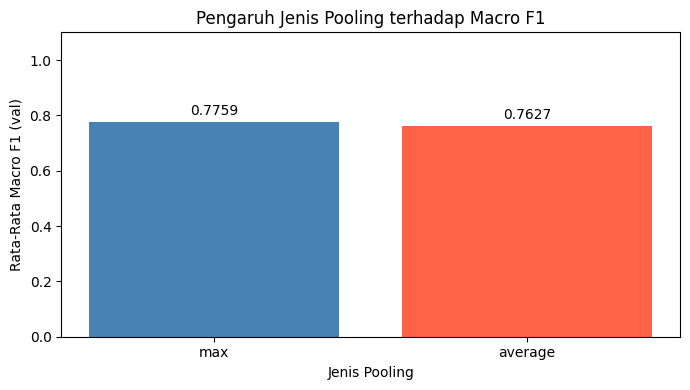


Model terbaik: conv4_f32-64_k3_max


In [ ]:
def _parse_name(name: str) -> dict:
    parts = name.split("_")
    return {
        "num_conv": int(parts[0].replace("conv", "")),
        "filters":  parts[1].replace("f", ""),
        "kernel":   int(parts[2].replace("k", "")),
        "pool":     parts[3],
    }

def analyze_hyperparameter_effect(
    all_results: list
):

    parsed = [(r["best_val_f1"], _parse_name(r["name"])) for r in all_results]

    for param_key, param_name in [
        ("num_conv", "Jumlah Conv Layer"),
        ("filters",  "Banyak Filter"),
        ("kernel",   "Ukuran Filter (kernel)"),
        ("pool",     "Jenis Pooling"),
    ]:
        groups = {}
        for f1, p in parsed:
            key = str(p[param_key])
            groups.setdefault(key, []).append(f1)

        avg_f1 = {k: np.mean(v) for k, v in groups.items()}

        fig, ax = plt.subplots(figsize=(7, 4))
        labels = list(avg_f1.keys())
        values = [avg_f1[k] for k in labels]
        bars = ax.bar(labels, values, color=["steelblue", "tomato", "seagreen", "gold"][:len(labels)])
        ax.bar_label(bars, fmt="%.4f", padding=3)
        ax.set_title(f"Pengaruh {param_name} terhadap Macro F1")
        ax.set_xlabel(param_name)
        ax.set_ylabel("Rata-Rata Macro F1 (val)")
        ax.set_ylim(0, 1.1)
        plt.tight_layout()
        plt.show()
        plt.close(fig)

all_cnn_results = train_all_experiments(
    X_train=X_train, y_train=y_train,
    X_val=X_val,     y_val=y_val,
    epochs=10,
    batch_size=32,
    weights_dir=WEIGHTS_DIR,
    logs_dir=LOGS_DIR,
    skip_existing=True,
)

gc.collect()  # bersihkan setelah semua eksperimen
keras.backend.clear_session()
summary = summarize_results(all_cnn_results)
best_cnn_name = summary["best_name"]

# Plot semua history
plot_all_histories(all_cnn_results, logs_dir=LOGS_DIR, save_dir=PLOTS_DIR)

# Analisis pengaruh hyperparameter
analyze_hyperparameter_effect(all_cnn_results)

print(f"\nModel terbaik: {best_cnn_name}")

## Setup: Flickr8k Feature Extraction & Caption Preprocessing

In [ ]:
# Path Flickr8k
FLICKR8K_ROOT    = adityajn105_flickr8k_path
IMAGES_DIR       = os.path.join(FLICKR8K_ROOT, "Images")
CAPTIONS_FILE    = os.path.join(FLICKR8K_ROOT, "captions.txt")
FEATURES_DIR    = "features"
CAPT_WEIGHTS_DIR = "weights/captioning"
CAPT_LOGS_DIR    = "logs/captioning"
CAPT_PLOTS_DIR   = "plots/captioning"

os.makedirs(FEATURES_DIR,    exist_ok=True)
os.makedirs(CAPT_WEIGHTS_DIR, exist_ok=True)
os.makedirs(CAPT_LOGS_DIR,    exist_ok=True)
os.makedirs(CAPT_PLOTS_DIR,   exist_ok=True)

# Baca captions.txt
def load_flickr8k_captions(captions_file):
    captions = {}
    with open(captions_file, "r") as f:
        for i, line in enumerate(f):
            line = line.strip()
            if i == 0 and line.lower().startswith("image"):
                continue   # skip header
            parts = line.split(",", 1)
            if len(parts) != 2:
                continue
            fname, cap = parts[0].strip(), parts[1].strip()
            cap = re.sub(r"[^a-zA-Z0-9 ]", "", cap.lower())
            captions.setdefault(fname, []).append(cap)
    return captions

all_captions = load_flickr8k_captions(CAPTIONS_FILE)
all_fnames   = sorted(all_captions.keys())

# Train / Val / Test split (6000/1000/1000)
np.random.seed(42)
shuffled = np.random.permutation(len(all_fnames))
train_fnames = [all_fnames[i] for i in shuffled[:6000]]
val_fnames   = [all_fnames[i] for i in shuffled[6000:7000]]
test_fnames  = [all_fnames[i] for i in shuffled[7000:8000]]

train_captions = {f: all_captions[f] for f in train_fnames}
val_captions   = {f: all_captions[f] for f in val_fnames}
test_captions  = {f: all_captions[f] for f in test_fnames}

print(f"Train: {len(train_fnames)}, Val: {len(val_fnames)}, Test: {len(test_fnames)}")

# Bangun vocabulary dari training captions
all_train_caps = [cap for caps in train_captions.values() for cap in caps]
word_to_idx, idx_to_word = build_vocab(all_train_caps, vocab_size=VOCAB_SIZE)
print(f"Vocab size: {len(word_to_idx)}")

# Simpan vocab
with open(os.path.join(FEATURES_DIR, "word_to_idx.json"), "w") as f:
    json.dump(word_to_idx, f)
with open(os.path.join(FEATURES_DIR, "idx_to_word.json"), "w") as f:
    json.dump({str(k): v for k, v in idx_to_word.items()}, f)

Train: 6000, Val: 1000, Test: 1000
Vocab size: 5000


In [ ]:
try:
    from tensorflow.keras import mixed_precision
    mixed_precision.set_global_policy('mixed_float16')
    print("Mixed precision float16 aktif")
except Exception as e:
    print(f"Mixed precision skip: {e}")

INCEPTION_SIZE = (299, 299)

base_cnn = KA.InceptionV3(
    weights="imagenet",
    include_top=False,
    pooling="avg",
    input_shape=(*INCEPTION_SIZE, 3),
)
base_cnn.trainable = False
print("InceptionV3 encoder loaded. Output shape:", base_cnn.output_shape)

def extract_features_flickr8k(
    encoder: keras.Model,
    image_paths: list,
    output_npy: str,
    batch_size: int = 32,
    force: bool = False,
) -> dict:
    fnames = [os.path.basename(p) for p in image_paths]

    # Derive fname_path from output_npy
    fname_path = output_npy.replace(".npy", "_fnames.json")

    if not force and os.path.exists(output_npy) and os.path.exists(fname_path):
        print(f"[Features] Loading cached features from {output_npy}")
        feats = np.load(output_npy)
        with open(fname_path) as jf:
            cached_fnames = json.load(jf)
        return dict(zip(cached_fnames, feats))

    feats_arr = extract_and_save_features(
        image_paths=image_paths,
        encoder=encoder,
        output_path=output_npy,
        target_size=INCEPTION_SIZE,
        batch_size=batch_size,
    )
    with open(fname_path, "w") as jf:
        json.dump(fnames, jf)
    return dict(zip(fnames, feats_arr))

# Prepare arguments for the new extract_features_flickr8k function calls
train_image_paths = [os.path.join(IMAGES_DIR, fn) for fn in train_fnames]
val_image_paths   = [os.path.join(IMAGES_DIR, fn) for fn in val_fnames]
test_image_paths  = [os.path.join(IMAGES_DIR, fn) for fn in test_fnames]

train_output_npy = os.path.join(FEATURES_DIR, "train_features.npy")
val_output_npy   = os.path.join(FEATURES_DIR, "val_features.npy")
test_output_npy  = os.path.join(FEATURES_DIR, "test_features.npy")

train_features = extract_features_flickr8k(base_cnn, train_image_paths, train_output_npy)
val_features   = extract_features_flickr8k(base_cnn, val_image_paths,   val_output_npy)
test_features  = extract_features_flickr8k(base_cnn, test_image_paths,  test_output_npy)

print(f"Feature shapes — train: {next(iter(train_features.values())).shape}")

Mixed precision float16 aktif
InceptionV3 encoder loaded. Output shape: (None, 2048)
[Features] Loading cached features from features/train_features.npy
[Features] Loading cached features from features/val_features.npy
[Features] Loading cached features from features/test_features.npy
Feature shapes — train: (2048,)


In [ ]:
ACTUAL_FEATURE_DIM = next(iter(train_features.values())).shape[0]

train_ds = make_caption_dataset(
    image_features=train_features,
    image_captions=train_captions,
    word_to_idx=word_to_idx,
    max_len=MAX_LEN,
    batch_size=64,
    shuffle=True,
)
val_ds = make_caption_dataset(
    image_features=val_features,
    image_captions=val_captions,
    word_to_idx=word_to_idx,
    max_len=MAX_LEN,
    batch_size=64,
    shuffle=False,
)
test_ds = make_caption_dataset(
    image_features=test_features,
    image_captions=test_captions,
    word_to_idx=word_to_idx,
    max_len=MAX_LEN,
    batch_size=64,
    shuffle=False,
)

print("Datasets created.")
print(f"  train batches: {len(train_ds)}")
print(f"  val   batches: {len(val_ds)}")

Datasets created.
  train batches: 469
  val   batches: 79


## 3.7 Perbandingan jumlah layer : RNN

In [ ]:
rnn_layer_results = []

for num_layers in RNN_GRID["num_rnn_layers"]:   # [1, 2, 3]
    name = rnn_exp_name("rnn", num_layers, 128)
    model = build_caption_decoder(
        rnn_type="rnn",
        num_rnn_layers=num_layers,
        hidden_units=128,
        vocab_size=len(word_to_idx),
        embed_dim=EMBED_DIM,
        feature_dim=ACTUAL_FEATURE_DIM,
        max_len=MAX_LEN,
    )
    result = train_one_decoder(
        name=name,
        model=model,
        train_ds=train_ds,
        val_ds=val_ds,
        epochs=10,
        weights_dir=CAPT_WEIGHTS_DIR,
        logs_dir=CAPT_LOGS_DIR,
    )
    bleu4 = evaluate_bleu4(
        model=model,
        image_features=test_features,
        image_captions=test_captions,
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
        n_images=200,
    )
    result.update({"rnn_type": "rnn", "num_layers": num_layers, "hidden_units": 128, "bleu4": bleu4})
    rnn_layer_results.append(result)
    print(f"  [rnn_layers_{num_layers}] BLEU-4: {bleu4:.4f}")

rnn_layer_df = pd.DataFrame([
    {"Num Layers": r["num_layers"], "BLEU-4": r["bleu4"], "Train Time (s)": r["train_time"]}
    for r in rnn_layer_results
])
display(rnn_layer_df)

Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


469/469 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step - accuracy: 0.6972 - loss: 2.1111 - val_accuracy: 0.7237 - val_loss: 1.6149
Epoch 2/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7262 - loss: 1.5850 - val_accuracy: 0.7288 - val_loss: 1.5304
Epoch 3/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7323 - loss: 1.5054 - val_accuracy: 0.7335 - val_loss: 1.4711
Epoch 4/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7366 - loss: 1.4440 - val_accuracy: 0.7363 - val_loss: 1.4315
Epoch 5/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7397 - loss: 1.3974 - val_accuracy: 0.7376 - val_loss: 1.4045
Epoch 6/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7420 - loss: 1.3617 - val_accuracy: 0.7386 - val_loss: 1.3888
Epoch 7/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7439 - loss: 1.3334 - val_accuracy: 0.7401 - val_loss: 1.3783
Epoch 8/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7456 - loss: 1.3098 - val_accuracy: 0.7401 - va

,Num Layers,BLEU-4,Train Time (s)
0,1,0.102338,62.628309
1,2,0.073583,76.886438
2,3,0.073082,94.706929


## 3.8 Perbandingan jumlah layer: LSTM

In [ ]:
lstm_layer_results = []

for num_layers in RNN_GRID["num_rnn_layers"]:   # [1, 2, 3]
    name = rnn_exp_name("lstm", num_layers, 128)
    model = build_caption_decoder(
        rnn_type="lstm",
        num_rnn_layers=num_layers,
        hidden_units=128,
        vocab_size=len(word_to_idx),
        embed_dim=EMBED_DIM,
        feature_dim=ACTUAL_FEATURE_DIM,
        max_len=MAX_LEN,
    )
    result = train_one_decoder(
        name=name,
        model=model,
        train_ds=train_ds,
        val_ds=val_ds,
        epochs=10,
        weights_dir=CAPT_WEIGHTS_DIR,
        logs_dir=CAPT_LOGS_DIR,
    )
    bleu4 = evaluate_bleu4(
        model=model,
        image_features=test_features,
        image_captions=test_captions,
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
        n_images=200,
    )
    result.update({"rnn_type": "lstm", "num_layers": num_layers, "hidden_units": 128, "bleu4": bleu4})
    lstm_layer_results.append(result)
    print(f"  [lstm_layers_{num_layers}] BLEU-4: {bleu4:.4f}")

lstm_layer_df = pd.DataFrame([
    {"Num Layers": r["num_layers"], "BLEU-4": r["bleu4"], "Train Time (s)": r["train_time"]}
    for r in lstm_layer_results
])
display(lstm_layer_df)

Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - accuracy: 0.6871 - loss: 2.2163 - val_accuracy: 0.7174 - val_loss: 1.6816
Epoch 2/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7212 - loss: 1.6411 - val_accuracy: 0.7242 - val_loss: 1.5805
Epoch 3/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7274 - loss: 1.5650 - val_accuracy: 0.7277 - val_loss: 1.5300
Epoch 4/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7318 - loss: 1.5082 - val_accuracy: 0.7329 - val_loss: 1.4758
Epoch 5/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7358 - loss: 1.4534 - val_accuracy: 0.7348 - val_loss: 1.4423
Epoch 6/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7389 - loss: 1.4100 - val_accuracy: 0.7379 - val_loss: 1.4105
Epoch 7/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7417 - loss: 1.3697 - val_accuracy: 0.7388 - val_loss: 1.3869
Epoch 8/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7439 - loss: 1.3362 - val_accuracy: 0.7405 - va

,Num Layers,BLEU-4,Train Time (s)
0,1,0.061024,60.964814
1,2,0.046853,86.994839
2,3,0.086943,109.448738


## 3.9 Perbandingan ukuran hidden state: RNN

In [ ]:
rnn_hidden_results = []

for hidden in RNN_GRID["hidden_units"]:
    name = rnn_exp_name("rnn", 2, hidden)
    model = build_caption_decoder(
        rnn_type="rnn",
        num_rnn_layers=2,
        hidden_units=hidden,
        vocab_size=len(word_to_idx),
        embed_dim=EMBED_DIM,
        feature_dim=ACTUAL_FEATURE_DIM,
        max_len=MAX_LEN,
    )
    result = train_one_decoder(
        name=name,
        model=model,
        train_ds=train_ds,
        val_ds=val_ds,
        epochs=10,
        weights_dir=CAPT_WEIGHTS_DIR,
        logs_dir=CAPT_LOGS_DIR,
    )
    bleu4 = evaluate_bleu4(
        model=model,
        image_features=test_features,
        image_captions=test_captions,
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
        n_images=200,
    )
    result.update({"rnn_type": "rnn", "num_layers": 2, "hidden_units": hidden, "bleu4": bleu4})
    rnn_hidden_results.append(result)
    print(f"  [rnn_hidden_{hidden}] BLEU-4: {bleu4:.4f}")

rnn_hidden_df = pd.DataFrame([
    {"Hidden Units": r["hidden_units"], "BLEU-4": r["bleu4"], "Train Time (s)": r["train_time"]}
    for r in rnn_hidden_results
])
display(rnn_hidden_df)

Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


469/469 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.6919 - loss: 2.1546 - val_accuracy: 0.7210 - val_loss: 1.6262
Epoch 2/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7246 - loss: 1.6015 - val_accuracy: 0.7264 - val_loss: 1.5458
Epoch 3/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7293 - loss: 1.5345 - val_accuracy: 0.7319 - val_loss: 1.4937
Epoch 4/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7345 - loss: 1.4751 - val_accuracy: 0.7345 - val_loss: 1.4535
Epoch 5/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7370 - loss: 1.4323 - val_accuracy: 0.7362 - val_loss: 1.4287
Epoch 6/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7387 - loss: 1.4002 - val_accuracy: 0.7379 - val_loss: 1.4092
Epoch 7/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.7403 - loss: 1.3745 - val_accuracy: 0.7380 - val_loss: 1.3978
Epoch 8/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7420 - loss: 1.3533 - val_accuracy: 0.73

,Hidden Units,BLEU-4,Train Time (s)
0,128,0.087678,74.197489
1,512,0.076087,82.455426


## 3.10 Perbandingan ukuran hidden state: LSTM

In [ ]:
lstm_hidden_results = []

for hidden in RNN_GRID["hidden_units"]:
    name = rnn_exp_name("lstm", 2, hidden)
    model = build_caption_decoder(
        rnn_type="lstm",
        num_rnn_layers=2,
        hidden_units=hidden,
        vocab_size=len(word_to_idx),
        embed_dim=EMBED_DIM,
        feature_dim=ACTUAL_FEATURE_DIM,
        max_len=MAX_LEN,
    )
    result = train_one_decoder(
        name=name,
        model=model,
        train_ds=train_ds,
        val_ds=val_ds,
        epochs=10,
        weights_dir=CAPT_WEIGHTS_DIR,
        logs_dir=CAPT_LOGS_DIR,
    )
    bleu4 = evaluate_bleu4(
        model=model,
        image_features=test_features,
        image_captions=test_captions,
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
        n_images=200,
    )
    result.update({"rnn_type": "lstm", "num_layers": 2, "hidden_units": hidden, "bleu4": bleu4})
    lstm_hidden_results.append(result)
    print(f"  [lstm_hidden_{hidden}] BLEU-4: {bleu4:.4f}")

lstm_hidden_df = pd.DataFrame([
    {"Hidden Units": r["hidden_units"], "BLEU-4": r["bleu4"], "Train Time (s)": r["train_time"]}
    for r in lstm_hidden_results
])
display(lstm_hidden_df)

Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


469/469 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - accuracy: 0.6702 - loss: 2.3972 - val_accuracy: 0.7045 - val_loss: 1.8035
Epoch 2/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7129 - loss: 1.7399 - val_accuracy: 0.7191 - val_loss: 1.6504
Epoch 3/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7208 - loss: 1.6409 - val_accuracy: 0.7231 - val_loss: 1.5936
Epoch 4/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7251 - loss: 1.5903 - val_accuracy: 0.7261 - val_loss: 1.5573
Epoch 5/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7278 - loss: 1.5536 - val_accuracy: 0.7277 - val_loss: 1.5305
Epoch 6/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7294 - loss: 1.5248 - val_accuracy: 0.7289 - val_loss: 1.5098
Epoch 7/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7306 - loss: 1.5000 - val_accuracy: 0.7297 - val_loss: 1.4930
Epoch 8/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7320 - loss: 1.4786 - val_accuracy: 0.73

,Hidden Units,BLEU-4,Train Time (s)
0,128,0.081292,84.975148
1,512,0.072123,99.934025


## 3.11 Analisis dan Visualisasi Variasi Hyperparameter RNN/LSTM

  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100
  [Keras generate] 100/100


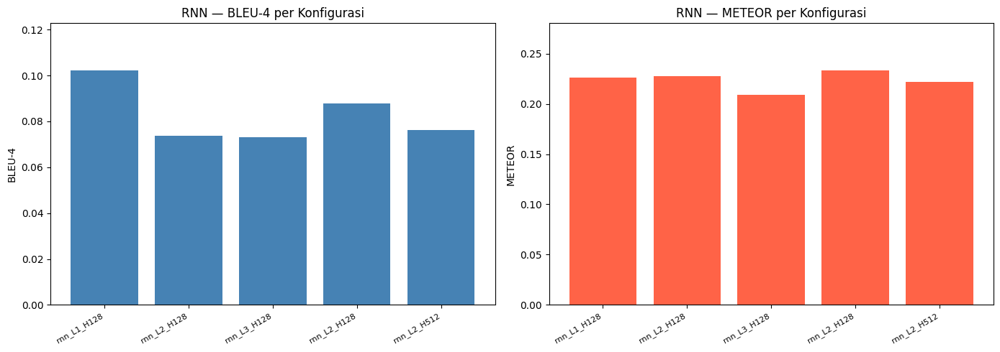

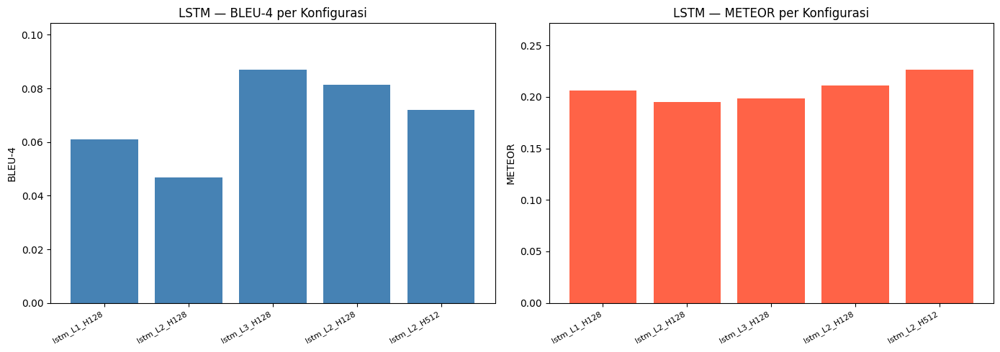

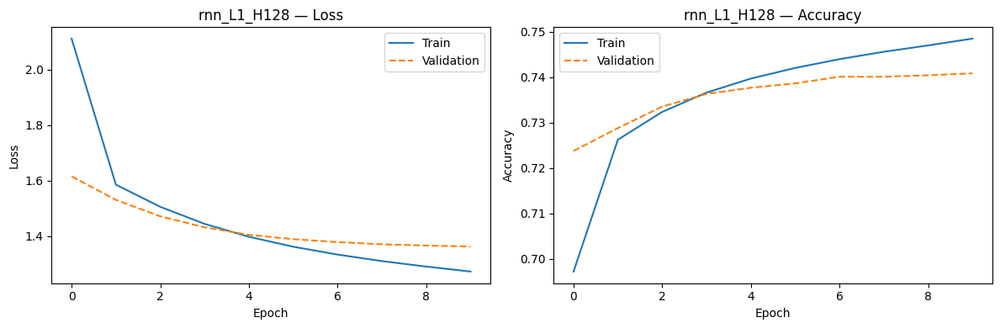

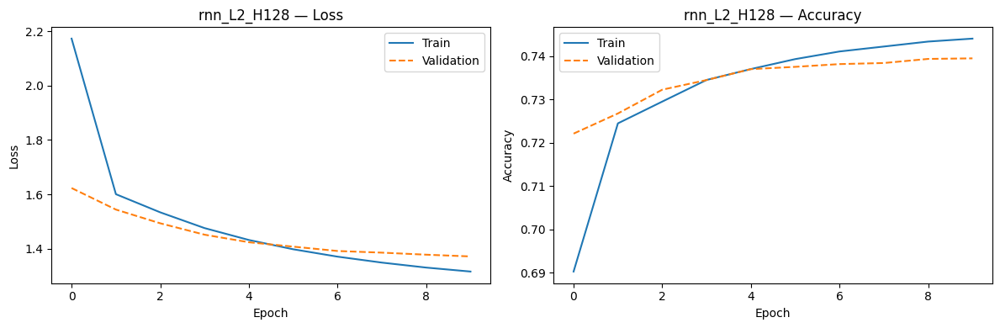

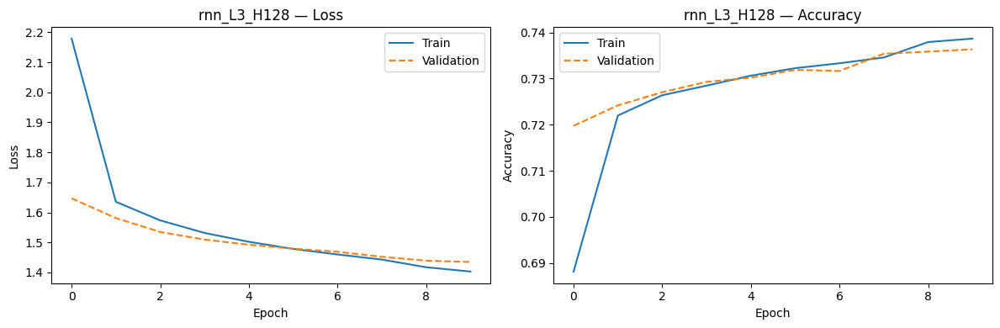

...

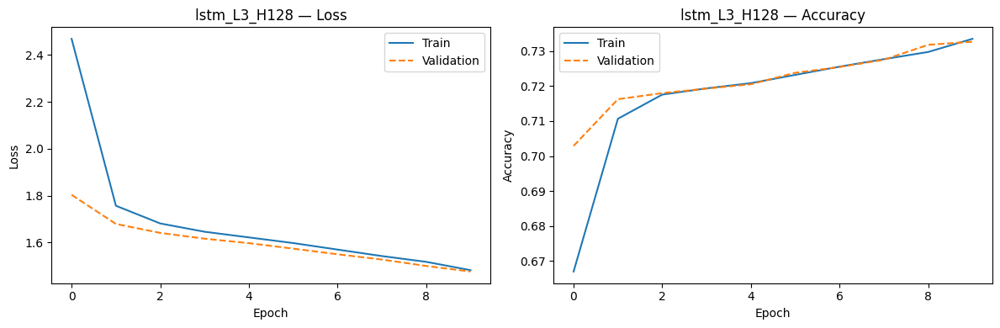

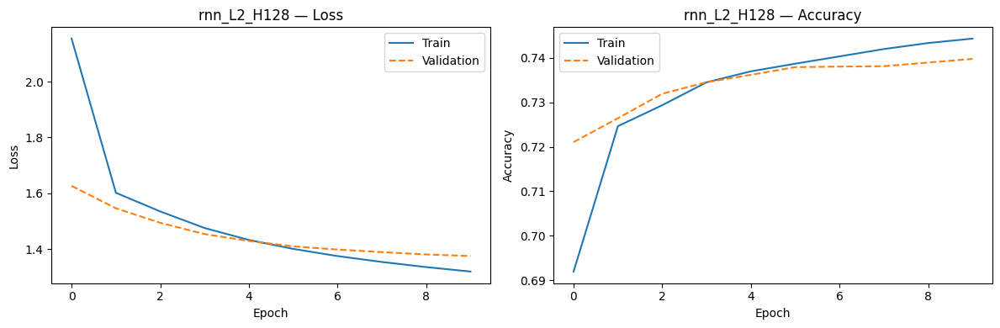

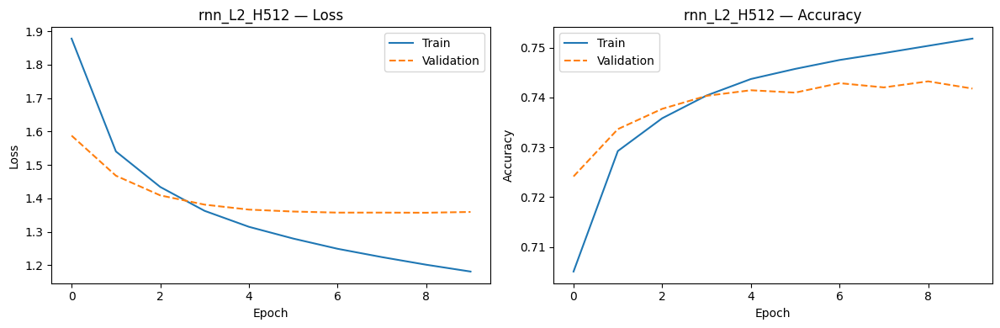

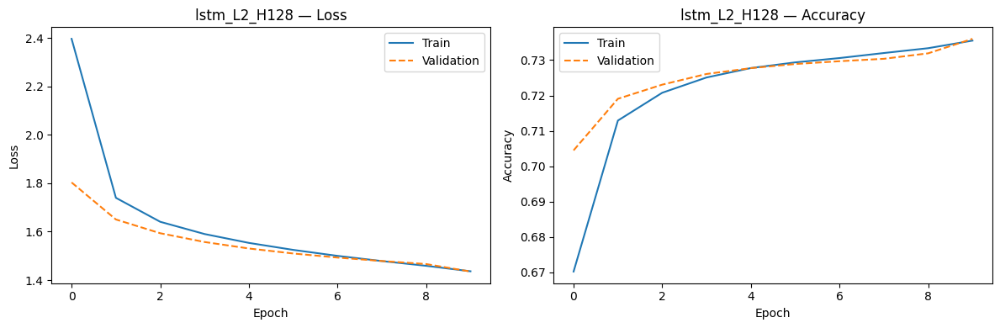

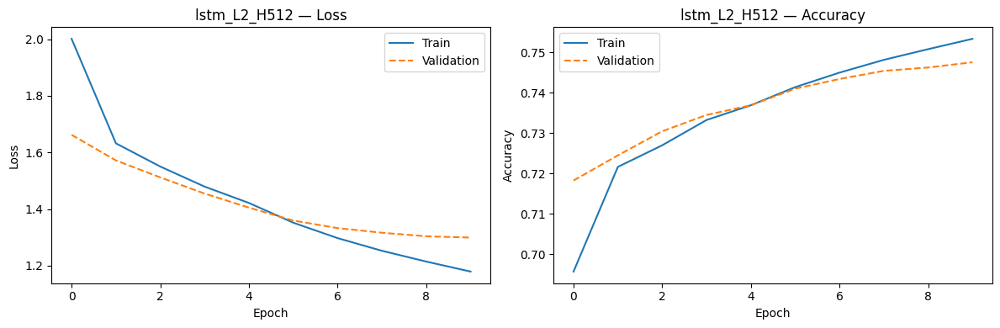

,Name,RNN Type,Layers,Hidden,BLEU-4,METEOR,Train Time (s)
0,rnn_L1_H128,RNN,1,128,0.102338,0.226201,62.628309
6,rnn_L2_H128,RNN,2,128,0.087678,0.233504,74.197489
5,lstm_L3_H128,LSTM,3,128,0.086943,0.198792,109.448738
8,lstm_L2_H128,LSTM,2,128,0.081292,0.210982,84.975148
7,rnn_L2_H512,RNN,2,512,0.076087,0.221676,82.455426
1,rnn_L2_H128,RNN,2,128,0.073583,0.227872,76.886438
2,rnn_L3_H128,RNN,3,128,0.073082,0.208913,94.706929
9,lstm_L2_H512,LSTM,2,512,0.072123,0.226217,99.934025
3,lstm_L1_H128,LSTM,1,128,0.061024,0.206362,60.964814
4,lstm_L2_H128,LSTM,2,128,0.046853,0.194892,86.994839


In [ ]:
nltk.download("wordnet", quiet=True)
nltk.download("punkt", quiet=True)
nltk.download("omw-1.4", quiet=True)

# Modified analyze_hyperparameter_variations to display plots
def analyze_hyperparameter_variations_display(all_results: list):
    for rnn_type in ("rnn", "lstm"):
        subset = [r for r in all_results if r.get("rnn_type") == rnn_type]
        if not subset:
            continue

        names   = [r["name"] for r in subset]
        bleu4s  = [r.get("bleu4", 0.0) for r in subset]
        meteors = [r.get("meteor", 0.0) for r in subset]

        x = np.arange(len(names))
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        axes[0].bar(x, bleu4s,  color="steelblue")
        axes[0].set_xticks(x); axes[0].set_xticklabels(names, rotation=30, ha="right", fontsize=8)
        axes[0].set_title(f"{rnn_type.upper()} — BLEU-4 per Konfigurasi")
        axes[0].set_ylabel("BLEU-4"); axes[0].set_ylim(0, max(bleu4s + [0.01]) * 1.2)

        axes[1].bar(x, meteors, color="tomato")
        axes[1].set_xticks(x); axes[1].set_xticklabels(names, rotation=30, ha="right", fontsize=8)
        axes[1].set_title(f"{rnn_type.upper()} — METEOR per Konfigurasi")
        axes[1].set_ylabel("METEOR"); axes[1].set_ylim(0, max(meteors + [0.01]) * 1.2)

        plt.tight_layout()
        plt.show()

# Modified plot_training_curves to display plots
def plot_training_curves_display(all_results: list):
    for r in all_results:
        hist = r.get("history")
        if hist is None:
            log = f"logs/captioning/{r['name']}_history.json"
            if os.path.exists(log):
                with open(log) as f:
                    hist = json.load(f)
        if hist is None:
            continue

        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        for ax, (tk, vk), ylabel in [
            (axes[0], ("loss",     "val_loss"),     "Loss"),
            (axes[1], ("accuracy", "val_accuracy"), "Accuracy"),
        ]:
            if tk in hist: ax.plot(hist[tk],     label="Train")
            if vk in hist: ax.plot(hist[vk], "--", label="Validation")
            ax.set_title(f"{r['name']} — {ylabel}")
            ax.set_xlabel("Epoch"); ax.set_ylabel(ylabel); ax.legend()
        plt.tight_layout()
        plt.show()


all_rnn_lstm_results = rnn_layer_results + lstm_layer_results + rnn_hidden_results + lstm_hidden_results

for r in all_rnn_lstm_results:
    gen_out = keras_generate_batch(
        model=r["model"],
        features=test_features,
        captions=test_captions,
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
        n_images=100,
    )
    tokenized_hypotheses = [nltk.word_tokenize(hyp.lower()) for hyp in gen_out["hypotheses"]]
    tokenized_references = [[nltk.word_tokenize(ref.lower()) for ref in refs] for refs in gen_out["references"]]
    r["meteor"] = compute_meteor(tokenized_hypotheses, tokenized_references)

# Plot bar chart BLEU-4 & METEOR, pengaruh layer & hidden
analyze_hyperparameter_variations_display(all_rnn_lstm_results)

# Plot training curves
plot_training_curves_display(all_rnn_lstm_results)

summary_df = pd.DataFrame([
    {
        "Name": r["name"],
        "RNN Type": r["rnn_type"].upper(),
        "Layers": r["num_layers"],
        "Hidden": r["hidden_units"],
        "BLEU-4": r.get("bleu4", 0),
        "METEOR": r.get("meteor", 0),
        "Train Time (s)": r["train_time"],
    }
    for r in all_rnn_lstm_results
])
display(summary_df.sort_values("BLEU-4", ascending=False))

## 3.12 Perbandingan RNN vs LSTM

In [ ]:
best_rnn_result  = max([r for r in all_rnn_lstm_results if r["rnn_type"] == "rnn"],
                        key=lambda r: r.get("bleu4", 0))
best_lstm_result = max([r for r in all_rnn_lstm_results if r["rnn_type"] == "lstm"],
                        key=lambda r: r.get("bleu4", 0))

print(f"Best RNN  model : {best_rnn_result['name']}  (BLEU-4={best_rnn_result.get('bleu4',0):.4f})")
print(f"Best LSTM model : {best_lstm_result['name']}  (BLEU-4={best_lstm_result.get('bleu4',0):.4f})")

best_rnn_model  = best_rnn_result["model"]
best_lstm_model = best_lstm_result["model"]

rnn_gen  = keras_generate_batch(best_rnn_model,  test_features, test_captions,
                                 word_to_idx, idx_to_word, max_len=MAX_LEN, n_images=50)
lstm_gen = keras_generate_batch(best_lstm_model, test_features, test_captions,
                                 word_to_idx, idx_to_word, max_len=MAX_LEN, n_images=50)

rnn_vs_lstm_metrics = compare_rnn_vs_lstm(
    rnn_hyps=rnn_gen["hypotheses"],   rnn_refs=rnn_gen["references"],   rnn_time=rnn_gen["time_s"],
    lstm_hyps=lstm_gen["hypotheses"], lstm_refs=lstm_gen["references"], lstm_time=lstm_gen["time_s"],
    image_features=test_features,
    image_captions=test_captions,
    fnames_test=rnn_gen["fnames"],
    n_qualitative=10,
    save_dir=CAPT_PLOTS_DIR,
)
print("RNN vs LSTM metrics:", rnn_vs_lstm_metrics)

Best RNN  model : rnn_L1_H128  (BLEU-4=0.1023)
Best LSTM model : lstm_L3_H128  (BLEU-4=0.0869)



Model                  BLEU-4   METEOR    Time(s)
SimpleRNN              0.0911   0.2236       50.0
LSTM                   0.0701   0.1974       45.2
RNN vs LSTM metrics: {'bleu4_rnn': 0.09105138145174094, 'bleu4_lstm': 0.07006307971331964, 'meteor_rnn': 0.22356634462919547, 'meteor_lstm': 0.19744912740507423}


## 3.13 Pengaruh panjang maksimum caption terhadap BLEU-4

In [ ]:
overall_best = max(all_rnn_lstm_results,
                   key=lambda r: r.get("bleu4", 0))
print(f"Model terbaik keseluruhan: {overall_best['name']}")

max_len_metrics = analyze_max_len_effect(
    model=overall_best["model"],
    image_features=test_features,
    image_captions=test_captions,
    word_to_idx=word_to_idx,
    idx_to_word=idx_to_word,
    max_len_values=[10, 20, 34, 45],   # >= 3 variasi
    is_scratch=False,
    model_name=overall_best["name"],
    save_dir=CAPT_PLOTS_DIR,
    n_images=50,
)

max_len_df = pd.DataFrame([
    {"Max Len": k, "BLEU-4": v} for k, v in sorted(max_len_metrics.items())
])
display(max_len_df)

Model terbaik keseluruhan: rnn_L1_H128
  max_len= 10  BLEU-4=0.1026
  max_len= 20  BLEU-4=0.0943
  max_len= 34  BLEU-4=0.0911
  max_len= 45  BLEU-4=0.0887
[Plot saved] plots/captioning/rnn_L1_H128_max_len_effect.png


,Max Len,BLEU-4
0,10,0.102580
1,20,0.094276
2,34,0.091051
3,45,0.088670


# 4. Perbandingan Keras vs from scratch

## 4.1 CNN - Forward Propagation From Scratch vs Keras

In [ ]:
WEIGHTS_DIR = "weights/cnn"
best_cnn_weight = os.path.join(WEIGHTS_DIR, f"{best_cnn_name}.keras")
best_keras_model = keras.models.load_model(best_cnn_weight)

print(f"Loaded best CNN model: {best_cnn_name}")
print(f"  Params: {best_keras_model.count_params():,}")

# Build from-scratch models (shared & non-shared)
scratch_cnn_shared    = CNNScratch.from_keras(best_keras_model, non_shared=False)
scratch_cnn_nonshared = CNNScratchLC.from_keras(best_keras_model)   # ganti Conv2D → LocallyConnected2D

# Reduce the number of samples for faster comparison
n_samples_for_comparison = 100
X_test_subset = X_test[:n_samples_for_comparison]
y_test_subset = y_test[:n_samples_for_comparison]

# Evaluasi Keras
t0 = time.time()
keras_result_cnn = evaluate_keras(best_keras_model, X_test_subset, y_test_subset)
keras_cnn_time   = time.time() - t0

# Evaluasi Scratch shared
t0 = time.time()
scratch_result_cnn = evaluate_scratch(scratch_cnn_shared, X_test_subset, y_test_subset)
scratch_cnn_time   = time.time() - t0

# Tampilkan perbandingan
compare_keras_vs_scratch(
    keras_result=keras_result_cnn,
    scratch_result=scratch_result_cnn,
    class_names=CLASS_NAMES,
    save_dir=PLOTS_DIR,
)

# Visualisasi prediksi
visualize_predictions(
    X_test=X_test_subset, y_true=y_test_subset,
    y_pred=keras_result_cnn["y_pred"],
    class_names=CLASS_NAMES,
    n_samples=10,
    save_dir=PLOTS_DIR,
    title="cnn_keras_predictions",
)
visualize_predictions(
    X_test=X_test_subset, y_true=y_test_subset,
    y_pred=scratch_result_cnn["y_pred"],
    class_names=CLASS_NAMES,
    n_samples=10,
    save_dir=PLOTS_DIR,
    title="cnn_scratch_predictions",
)

cnn_comparison_df = pd.DataFrame([
    {"Implementation": "Keras (Shared)",    "Macro F1": keras_result_cnn["f1"],   "Time (s)": round(keras_cnn_time, 3)},
    {"Implementation": "Scratch (Shared)",  "Macro F1": scratch_result_cnn["f1"], "Time (s)": round(scratch_cnn_time, 3)},
])
display(cnn_comparison_df)

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 30 variables whereas the saved optimizer has 26 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 26 variables whereas the saved optimizer has 0 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Loaded best CNN model: conv4_f32-64_k3_max
  Params: 11,272,102


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


  [Scratch forward] 100/100


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


TypeError: compare_keras_vs_scratch() got an unexpected keyword argument 'keras_result'

## 4.2 CNN - Shared vs Non-Shared (From Scratch)

In [ ]:
_parts = best_cnn_name.split("_")
_nc    = int(_parts[0].replace("conv",""))
_filt  = [int(x) for x in _parts[1].replace("f","").split("-")]
_ksz   = int(_parts[2].replace("k",""))
_pool  = _parts[3]

nonshared_best_model = build_cnn_model(
    num_conv_layers=_nc,
    filters=_filt,
    kernel_size=_ksz,
    pooling_type=_pool,
    use_locally_connected=True,
)
nonshared_best_result = train_one(
    name=f"nonshared_{best_cnn_name}",
    model=nonshared_best_model,
    X_train=X_train, y_train=y_train,
    X_val=X_val,     y_val=y_val,
    epochs=10,
    weights_dir=WEIGHTS_DIR,
    logs_dir=LOGS_DIR,
)

scratch_ns = CNNScratch.from_keras(nonshared_best_model, non_shared=True)

compare_shared_vs_nonshared(
    keras_shared_model=best_keras_model,
    keras_nonshared_model=nonshared_best_model,
    scratch_shared=scratch_cnn_shared,
    scratch_nonshared=scratch_ns,
    X_test=X_test, y_test=y_test,
    save_dir=PLOTS_DIR,
)

TypeError: 'NoneType' object cannot be interpreted as an integer

## 4.3 RNN/LSTM - Forward Propagation From Scratch vs Keras

In [ ]:
for rnn_type, best_result in [("rnn", best_rnn_result), ("lstm", best_lstm_result)]:
    print(f"\n{'='*55}")
    print(f"[{rnn_type.upper()}] Loading best model: {best_result['name']}")

    keras_model_cap = keras.models.load_model(best_result["weight_path"], safe_mode=False)

    # Build from-scratch captioning model
    scratch_cap = CaptioningModelScratch(rnn_type=rnn_type)
    scratch_cap.load_weights_from_keras(keras_model_cap)

    # Keras generation on test set (subset 50)
    keras_gen = keras_generate_batch(
        model=keras_model_cap,
        features=test_features,
        captions=test_captions,
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
        n_images=50,
    )

    # Scratch generation on same images
    scratch_gen = batch_bleu4_scratch(
        scratch_model=scratch_cap,
        image_features={f: test_features[f] for f in keras_gen["fnames"]},
        image_captions={f: test_captions[f] for f in keras_gen["fnames"]},
        word_to_idx=word_to_idx,
        idx_to_word=idx_to_word,
        max_len=MAX_LEN,
    )

    # Compare
    compare_caption_keras_scratch(
        keras_hyps=keras_gen["hypotheses"],   keras_refs=keras_gen["references"],   keras_time=keras_gen["time_s"],
        scratch_hyps=scratch_gen["hypotheses"], scratch_refs=scratch_gen["references"], scratch_time=scratch_gen["time_s"],
        rnn_type=rnn_type,
    )

    # Display the plot after comparison
    plt.show()



[RNN] Loading best model: rnn_L1_H128


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(




  BLEU-4 (scratch): 0.0023  (0.3s)

Model                       BLEU-4   METEOR    Time(s)
Keras RNN                   0.0911   0.2236       50.3
Scratch RNN                 0.1451   0.1451        0.3
[Plot saved] plots/captioning/rnn_keras_vs_scratch.png

[LSTM] Loading best model: lstm_L3_H128


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/trainer.py:212: UserWarning: Model doesn't support `jit_compile=True`. Proceeding with `jit_compile=False`.
  warnings.warn(


/tmp/ipykernel_484/3363643451.py:87: RuntimeWarning: overflow encountered in exp
  return 1.0 / (1.0 + np.exp(-np.clip(x, -500, 500)))



  BLEU-4 (scratch): 0.0044  (0.2s)

Model                       BLEU-4   METEOR    Time(s)
Keras LSTM                  0.0701   0.1974       44.6
Scratch LSTM                0.1440   0.1440        0.2
[Plot saved] plots/captioning/lstm_keras_vs_scratch.png


# 5. Model Persistence

In [ ]:
print("=== Saved CNN Weights ===")
for f in sorted(os.listdir(WEIGHTS_DIR)):
    size = os.path.getsize(os.path.join(WEIGHTS_DIR, f)) / 1024
    print(f"  {f:60s}  {size:8.1f} KB")

print("\n=== Saved Captioning Weights ===")
for f in sorted(os.listdir(CAPT_WEIGHTS_DIR)):
    size = os.path.getsize(os.path.join(CAPT_WEIGHTS_DIR, f)) / 1024
    print(f"  {f:60s}  {size:8.1f} KB")

print("\n[Verify] Re-loading best CNN model and checking F1...")
_reload = keras.models.load_model(os.path.join(WEIGHTS_DIR, f"{best_cnn_name}.keras"))
_pred   = np.argmax(_reload.predict(X_test[:100], verbose=0), axis=-1)
_f1     = macro_f1(y_test[:100], _pred)
print(f"  Best CNN model reloaded — F1 on 100 test samples: {_f1:.4f}")

print("\n[Verify] Re-loading best LSTM captioning model and generating a caption...")
_cap_model = keras.models.load_model(best_lstm_result["weight_path"], safe_mode=False)
_sample_fname = test_fnames[0]
_sample_feat  = test_features[_sample_fname]
_cap = generate_caption_greedy(_cap_model, _sample_feat, word_to_idx, idx_to_word, max_len=MAX_LEN)
print(f"  Sample caption for '{_sample_fname}': {_cap}")
print(f"  Ground truth: {test_captions[_sample_fname][:2]}")

=== Saved CNN Weights ===
  cnn_filters_32-64.keras                                       540277.4 KB
  cnn_filters_64-128.keras                                      1080936.7 KB
  cnn_kernel_3.keras                                            540277.4 KB
  cnn_kernel_5.keras                                            540679.4 KB
  cnn_layers_2.keras                                            1080936.7 KB
  cnn_layers_4.keras                                            267256.9 KB
  cnn_pool_average.keras                                        540277.4 KB
  cnn_pool_max.keras                                            540277.4 KB
  conv2_f32-64_k3_average.keras                                 540277.4 KB
  conv2_f32-64_k3_max.keras                                     540277.4 KB
  conv2_f32-64_k5_average.keras                                 540679.4 KB
  conv2_f32-64_k5_max.keras                                     540679.4 KB
  conv2_f64-128_k3_average.keras                            

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 30 variables whereas the saved optimizer has 26 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 26 variables whereas the saved optimizer has 0 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


  Best CNN model reloaded — F1 on 100 test samples: 0.2059

[Verify] Re-loading best LSTM captioning model and generating a caption...


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:982: UserWarning: Layer 'trim_last' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/trainers/trainer.py:212: UserWarning: Model doesn't support `jit_compile=True`. Proceeding with `jit_compile=False`.
  warnings.warn(


  Sample caption for '1685463722_55843b6d3c.jpg': a man in a red shirt is a a in
  Ground truth: ['a woman and her two dogs are walking down the street ', 'a woman wearing cut off shorts walks down the street with a dog ']


In [ ]:
!zip -r backup.zip /content/features /content/logs /content/plots /content/weights

  adding: content/features/ (stored 0%)
  adding: content/features/val_features_fnames.json (deflated 54%)
  adding: content/features/test_features_fnames.json (deflated 54%)
  adding: content/features/val_fnames.json (deflated 54%)
  adding: content/features/word_to_idx.json (deflated 61%)
  adding: content/features/idx_to_word.json (deflated 65%)
  adding: content/features/test_features.npy (deflated 11%)
  adding: content/features/train_features.npy (deflated 11%)
  adding: content/features/test_fnames.json (deflated 54%)
  adding: content/features/train_features_fnames.json (deflated 55%)
  adding: content/features/train_fnames.json (deflated 55%)
  adding: content/features/val_features.npy (deflated 11%)
  adding: content/logs/ (stored 0%)
  adding: content/logs/cnn/ (stored 0%)
  adding: content/logs/cnn/cnn_kernel_5_history.json (deflated 56%)
  adding: content/logs/cnn/conv2_f64-128_k5_max_history.json (deflated 56%)
  adding: content/logs/cnn/conv4_f64-128_k5_max_history.json 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp backup.zip /content/drive/MyDrive/